**Context**

As an analyst at ABC Estate Wines, we are presented with historical data encompassing the sales of different types of wines throughout the 20th century. These datasets originate from the same company but represent sales figures for distinct wine varieties. Our objective is to delve into the data, analyze trends, patterns, and factors influencing wine sales over the course of the century. By leveraging data analytics and forecasting techniques, we aim to gain actionable insights that can inform strategic decision-making and optimize sales strategies for the future.

**Objective**

The primary objective of this project is to analyze and forecast wine sales trends for the 20th century based on historical data provided by ABC Estate Wines. We aim to equip ABC Estate Wines with the necessary insights and foresight to enhance sales performance, capitalize on emerging market opportunities, and maintain a competitive edge in the wine industry.

# Exploratory Data Analysis

In [493]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.offline as py
py.init_notebook_mode()
%matplotlib inline
# it globally changes the figure size
from pylab import rcParams
rcParams['figure.figsize'] = 15,8
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import mean_squared_error as mse

from   statsmodels.tsa.api             import ExponentialSmoothing, SimpleExpSmoothing, Holt
from   IPython.display                 import display

In [494]:
df1 = pd.read_csv(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\Rose.csv",parse_dates=['YearMonth'])
df2 = pd.read_csv(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\Sparkling.csv",parse_dates=['YearMonth']) 
df1.head()

,YearMonth,Rose
0,1980-01-01,112.0
1,1980-02-01,118.0
2,1980-03-01,129.0
3,1980-04-01,99.0
4,1980-05-01,116.0


In [495]:
df2[df2.duplicated(subset=['YearMonth'], keep=False)]

,YearMonth,Sparkling


In [496]:
df1[df1.duplicated(subset=['YearMonth'], keep=False)]

,YearMonth,Rose


In [497]:
df2.head()

,YearMonth,Sparkling
0,1980-01-01,1686
1,1980-02-01,1591
2,1980-03-01,2304
3,1980-04-01,1712
4,1980-05-01,1471


In [498]:
df1.describe()

,YearMonth,Rose
count,187,185.000000
mean,1987-10-01 08:51:20.213903744,90.394595
min,1980-01-01 00:00:00,28.000000
25%,1983-11-16 00:00:00,63.000000
50%,1987-10-01 00:00:00,86.000000
75%,1991-08-16 12:00:00,112.000000
max,1995-07-01 00:00:00,267.000000
std,NaN,39.175344


In [499]:
df2.describe()

,YearMonth,Sparkling
count,187,187.000000
mean,1987-10-01 08:51:20.213903744,2402.417112
min,1980-01-01 00:00:00,1070.000000
25%,1983-11-16 00:00:00,1605.000000
50%,1987-10-01 00:00:00,1874.000000
75%,1991-08-16 12:00:00,2549.000000
max,1995-07-01 00:00:00,7242.000000
std,NaN,1295.111540


In [500]:
df1.info()
print(df2.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   YearMonth  187 non-null    datetime64[ns]
 1   Rose       185 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 3.1 KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   YearMonth  187 non-null    datetime64[ns]
 1   Sparkling  187 non-null    int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 3.1 KB
None


In [501]:

# Convert column to datetime
# df1['YearMonth'] = pd.to_datetime(df1['YearMonth'])
df1.set_index('YearMonth',inplace=True)
# Convert column to datetime
# df2['YearMonth'] = pd.to_datetime(df2['YearMonth'])
df2.set_index('YearMonth',inplace=True)

In [502]:
df1.info()
print(df2.info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 187 entries, 1980-01-01 to 1995-07-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Rose    185 non-null    float64
dtypes: float64(1)
memory usage: 2.9 KB
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 187 entries, 1980-01-01 to 1995-07-01
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   Sparkling  187 non-null    int64
dtypes: int64(1)
memory usage: 2.9 KB
None


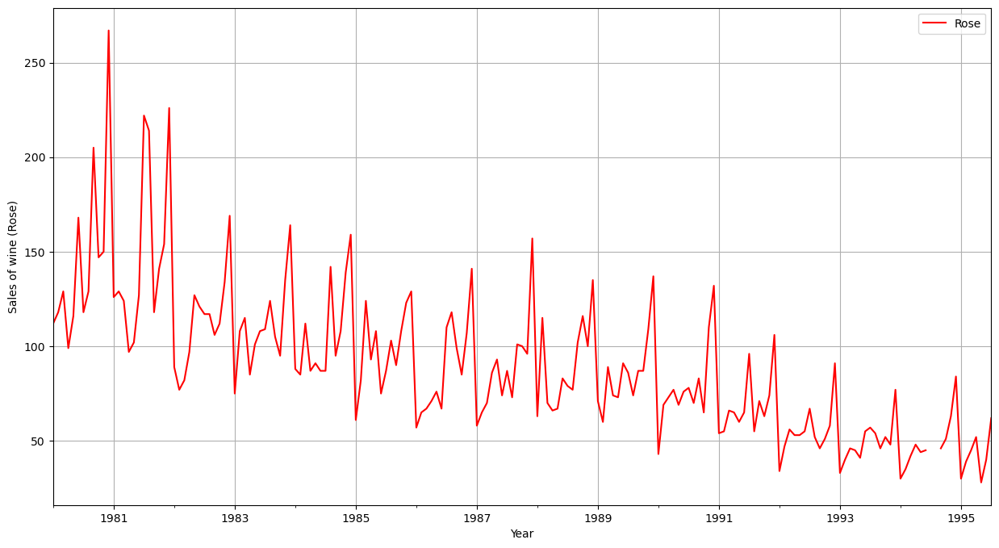

In [503]:
df1.plot(color = 'red')
plt.grid()
plt.xlabel('Year')
plt.ylabel('Sales of wine (Rose)')
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose1.jpg")

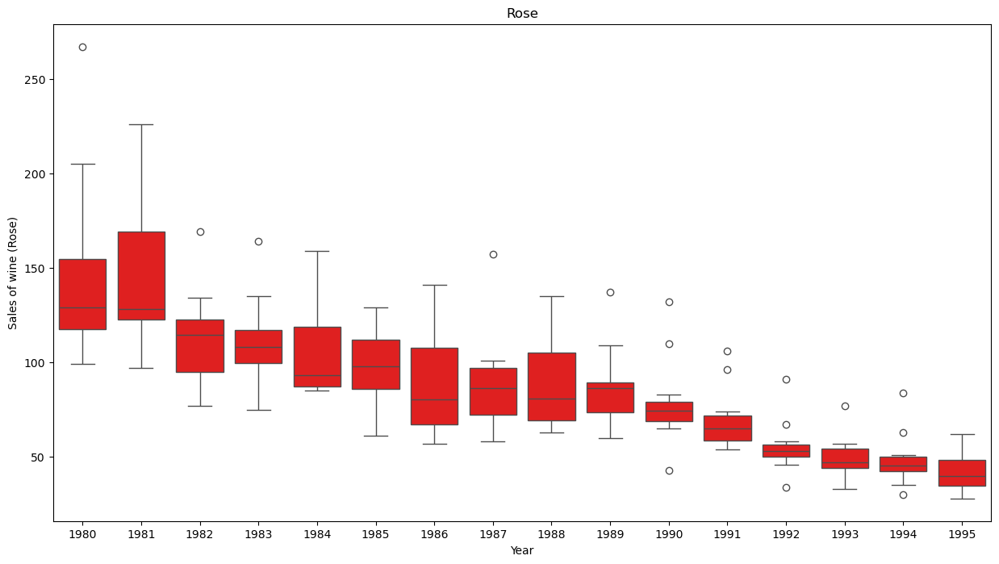

In [504]:
sns.boxplot(df1,x=df1.index.year,y=df1['Rose'],color='red')
plt.xlabel('Year')
plt.ylabel('Sales of wine (Rose)')
plt.title('Rose')
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose2.jpg")

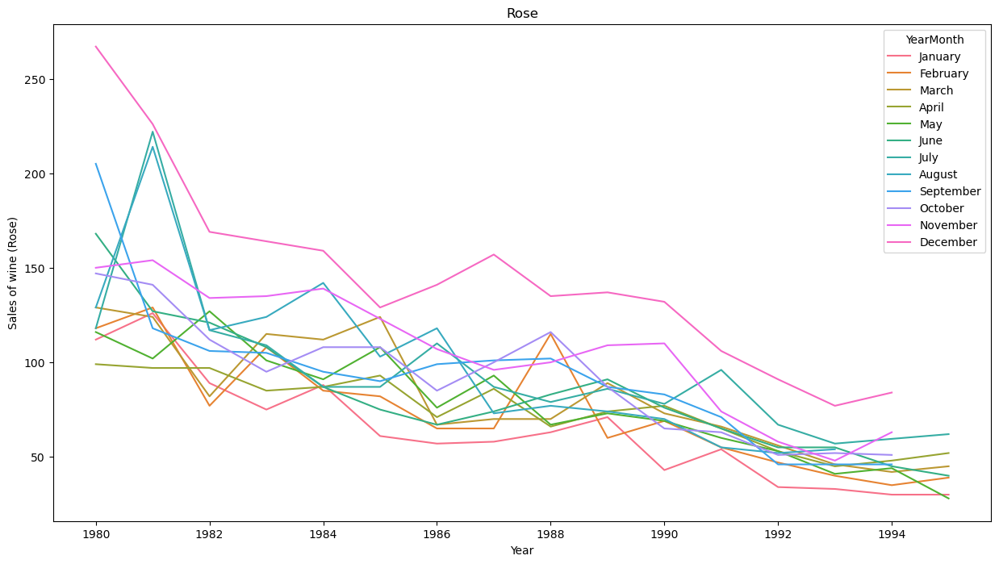

In [505]:
sns.lineplot(df1,x=df1.index.year,y=df1['Rose'],hue=df1.index.month_name())
plt.xlabel('Year')
plt.ylabel('Sales of wine (Rose)')
plt.title('Rose')
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose-fig1.jpg")

In [506]:
df1

,Rose
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0
...,...
1995-03-01,45.0
1995-04-01,52.0
1995-05-01,28.0


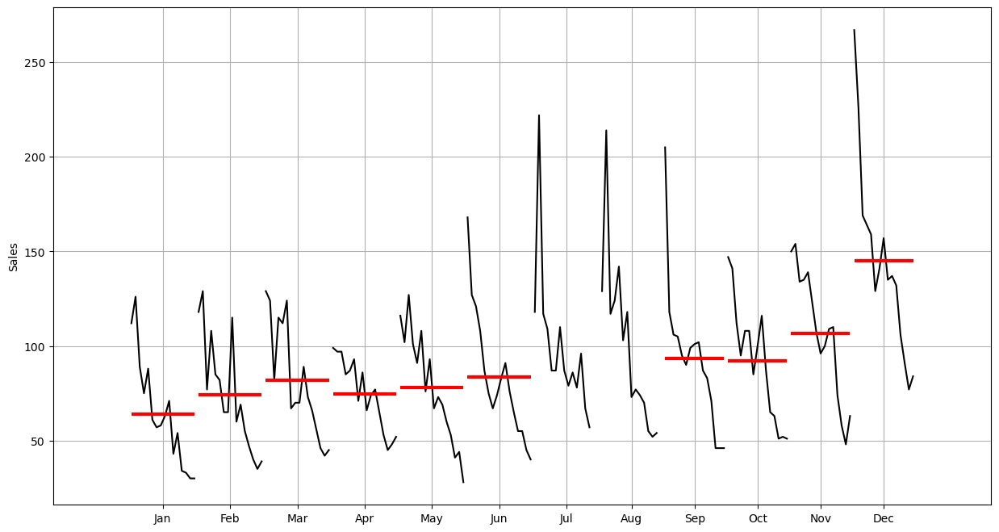

In [507]:
from statsmodels.graphics.tsaplots import month_plot
month_plot(df1['Rose'],ylabel='Sales')
plt.grid()

plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose-fig2.jpg")

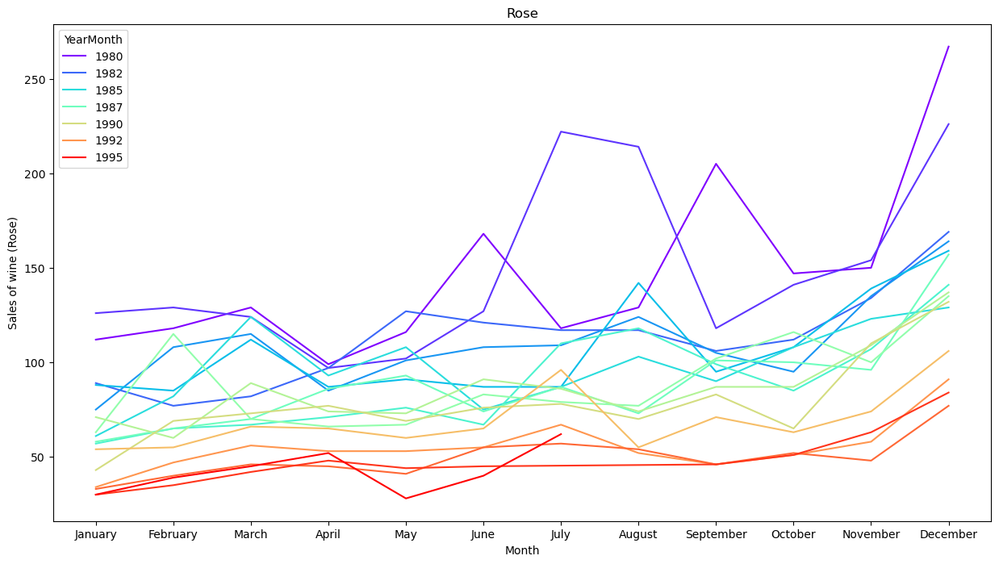

In [508]:
sns.lineplot(df1,hue=df1.index.year,y=df1['Rose'],x=df1.index.month_name(),palette='rainbow')
plt.xlabel('Month')
plt.ylabel('Sales of wine (Rose)')
plt.title('Rose')
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose-fig3.jpg")

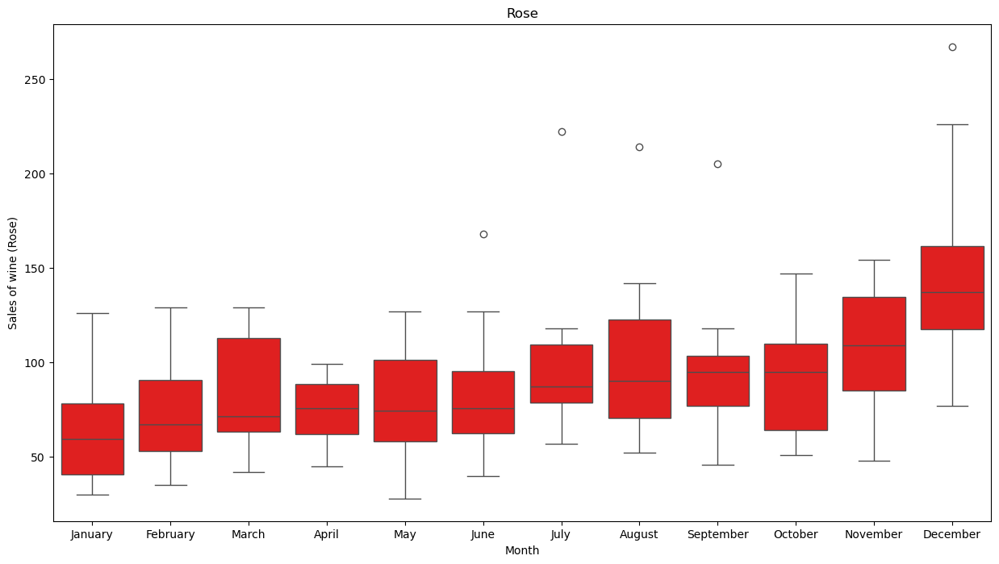

In [509]:
sns.boxplot(df1,x=df1.index.month_name(),y=df1['Rose'],color='red')
plt.xlabel('Month')
plt.ylabel('Sales of wine (Rose)')
plt.title('Rose')

plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose3.jpg")

## Plot the Empirical Cumulative Distribution.

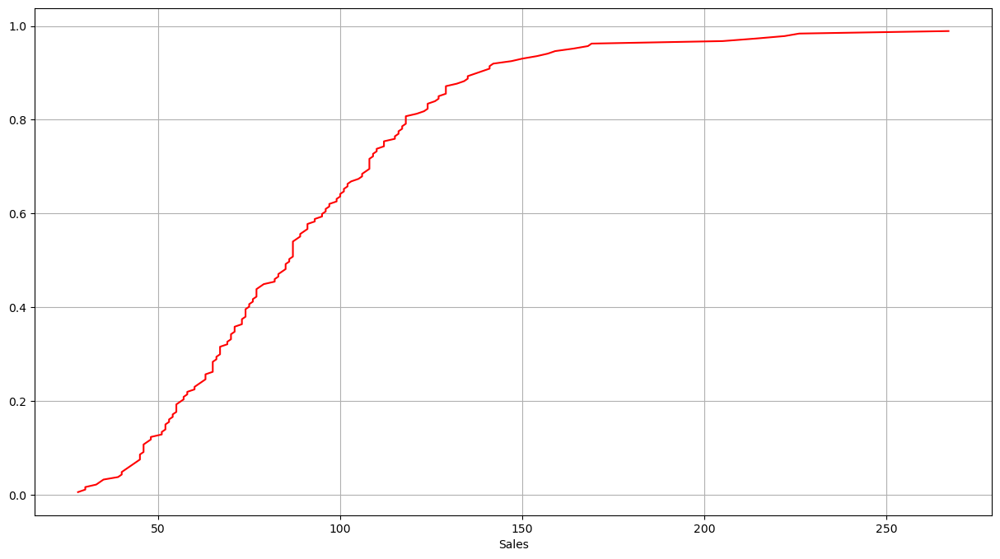

In [511]:
from statsmodels.distributions.empirical_distribution import ECDF
cdf =ECDF(df1['Rose'])
plt.plot(cdf.x,cdf.y,color='red')
plt.grid()
plt.xlabel('Sales');

plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose-fig4.jpg")

This particular graph tells us what percentage of data points refer to what number of Sales.

## Plot the average RetailSales per month and the month on month percentage change of RetailSales.

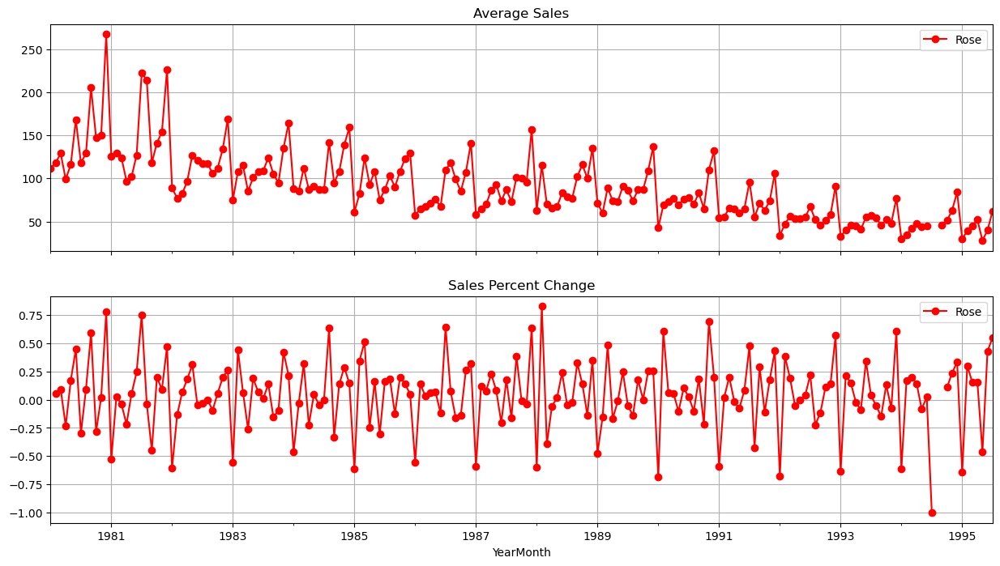

In [514]:
# Group by date and get average RetailSales, and percent change
average = df1.groupby(df1.index)["Rose"].mean()
pct_change = df1.groupby(df1.index)["Rose"].sum().pct_change()

fig, (axis1, axis2) = plt.subplots(2, 1, sharex=True, figsize=(15, 8))

# Plot average RetailSales over time (year-month)
ax1 = average.plot(legend=True, ax=axis1, marker='o', title="Average Sales", grid=True,color='red')
ax1.set_xticks(range(len(average)))
ax1.set_xticklabels(average.index.tolist())

# Plot percent change for RetailSales over time (year-month)
ax2 = pct_change.plot(
    legend=True, 
    ax=axis2, 
    marker='o', 
    colormap="summer", 
    title="Sales Percent Change", 
    grid=True,
    color='red'
)

plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose-fig5.jpg")

## Sparkling

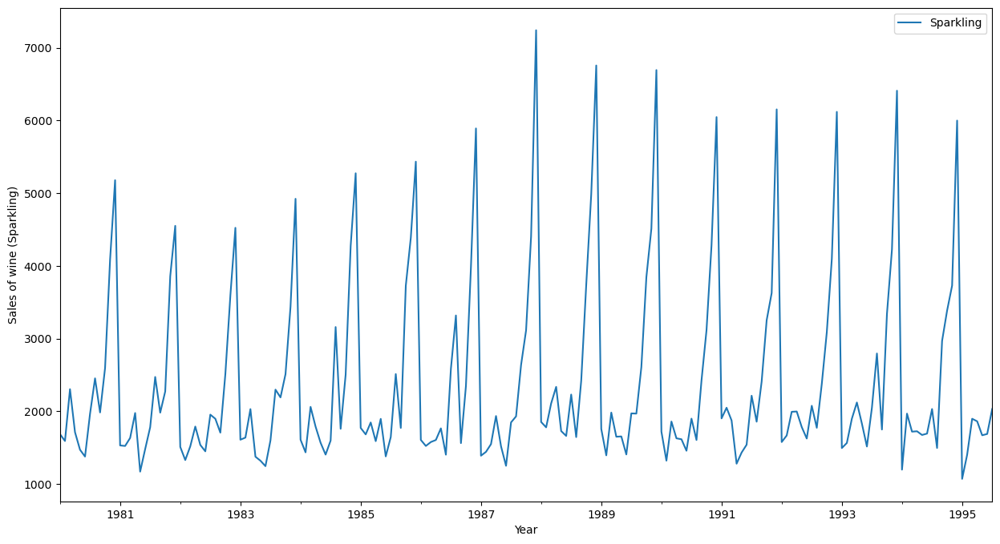

In [516]:
df2.plot()
plt.xlabel('Year')
plt.ylabel('Sales of wine (Sparkling)')
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp1.jpg")

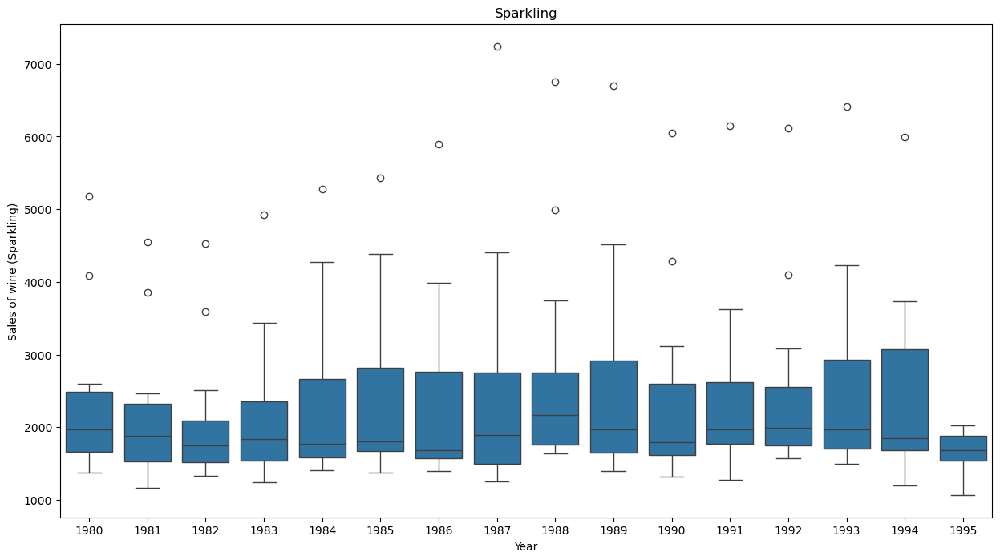

In [517]:
sns.boxplot(df2,x=df2.index.year,y=df2['Sparkling'])
plt.xlabel('Year')
plt.ylabel('Sales of wine (Sparkling)')
plt.title('Sparkling')
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp2.jpg")

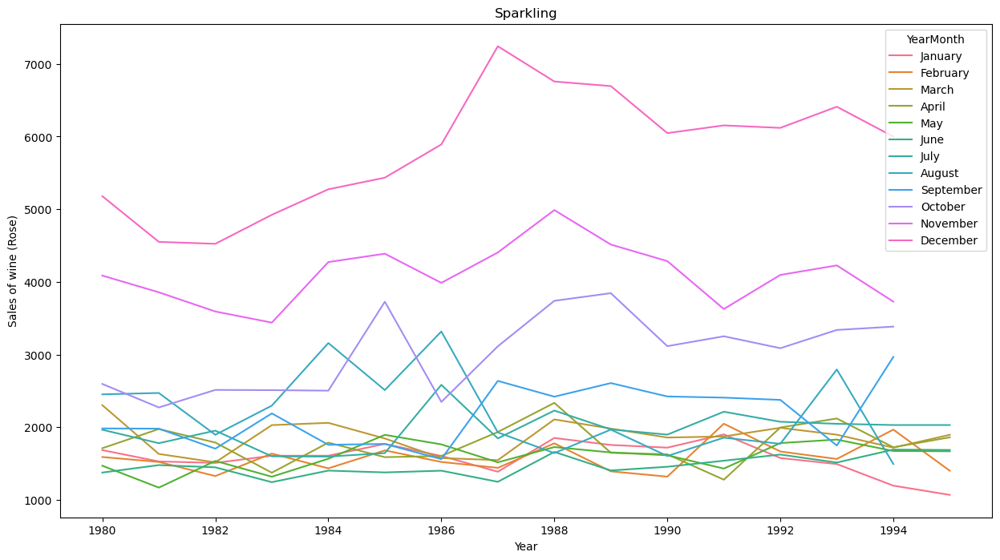

In [518]:
sns.lineplot(df2,x=df2.index.year,y=df2['Sparkling'],hue=df2.index.month_name())
plt.xlabel('Year')
plt.ylabel('Sales of wine (Rose)')
plt.title('Sparkling')
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp-fig1.jpg")

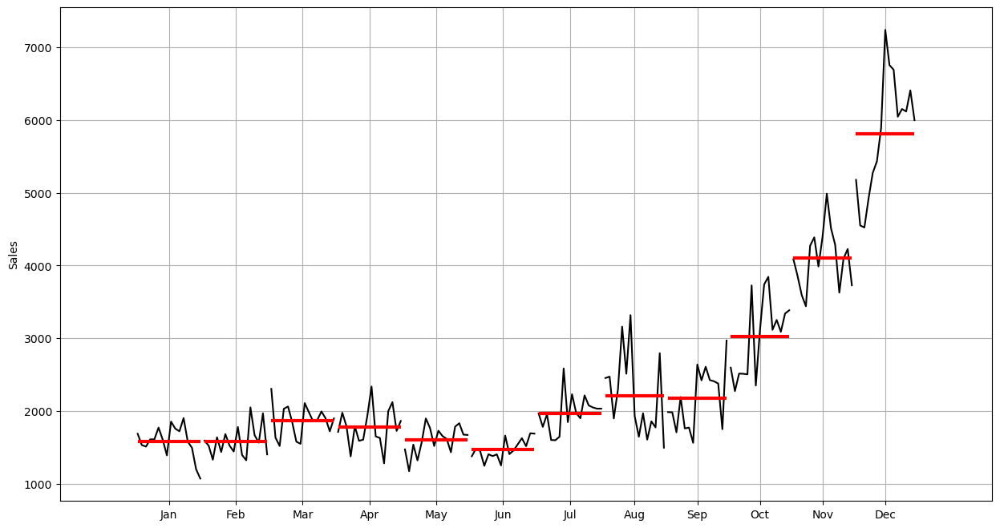

In [519]:
from statsmodels.graphics.tsaplots import month_plot
month_plot(df2['Sparkling'],ylabel='Sales')
plt.grid()

plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp-fig2.jpg")

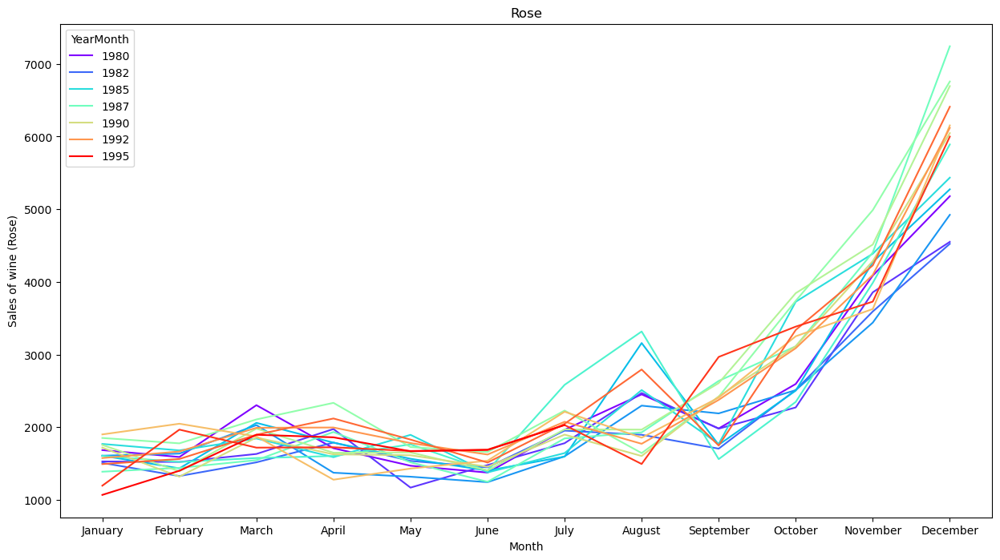

In [520]:
sns.lineplot(df2,hue=df2.index.year,y=df2['Sparkling'],x=df2.index.month_name(),palette='rainbow')
plt.xlabel('Month')
plt.ylabel('Sales of wine (Rose)')
plt.title('Rose')
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp-fig3.jpg")

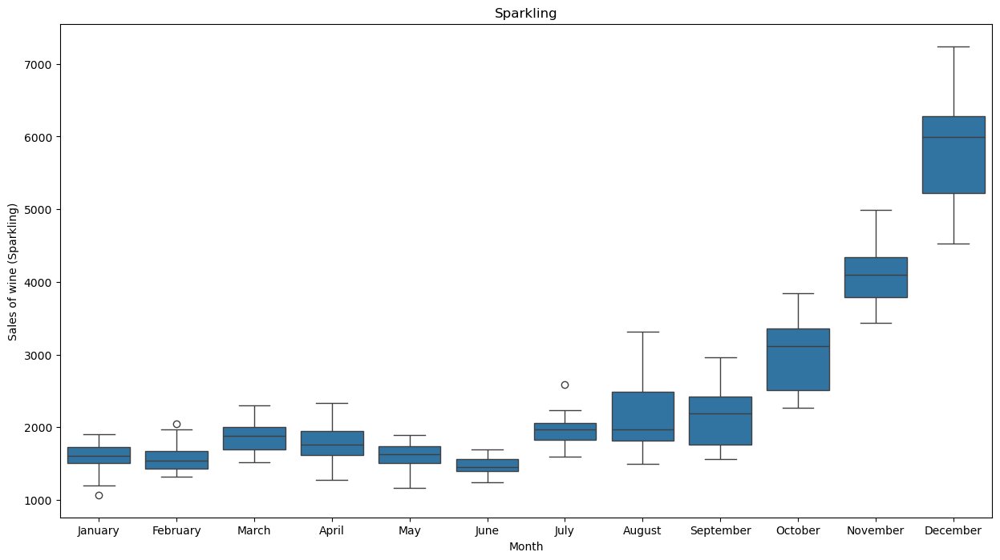

In [521]:
sns.boxplot(df2,x=df2.index.month_name(),y=df2['Sparkling'])
plt.xlabel('Month')
plt.ylabel('Sales of wine (Sparkling)')
plt.title('Sparkling')
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp3.jpg")

## Plot the Empirical Cumulative Distribution.

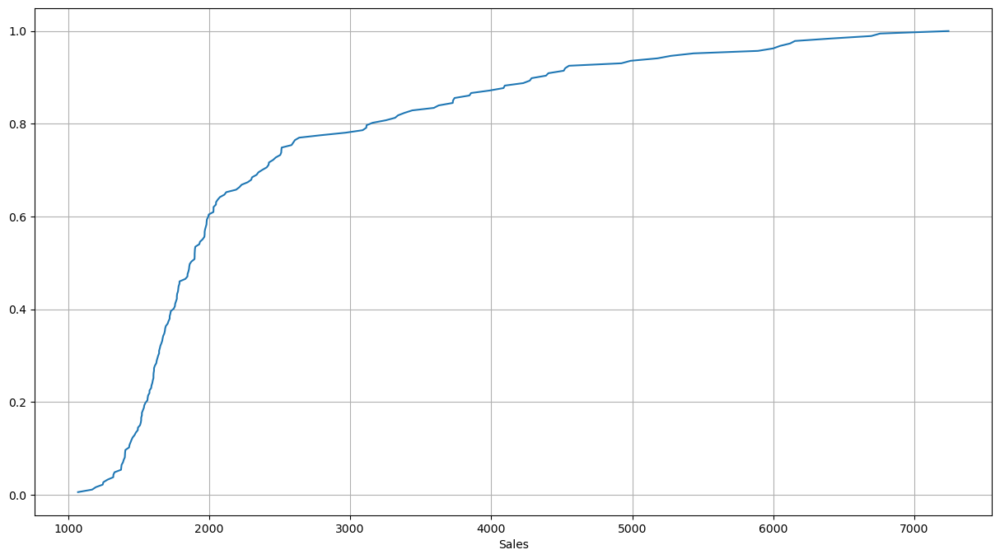

In [523]:
from statsmodels.distributions.empirical_distribution import ECDF
cdf =ECDF(df2['Sparkling'])
plt.plot(cdf.x,cdf.y)
plt.grid()
plt.xlabel('Sales');

plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp-fig4.jpg")

## Plot the average RetailSales per month and the month on month percentage change of RetailSales.

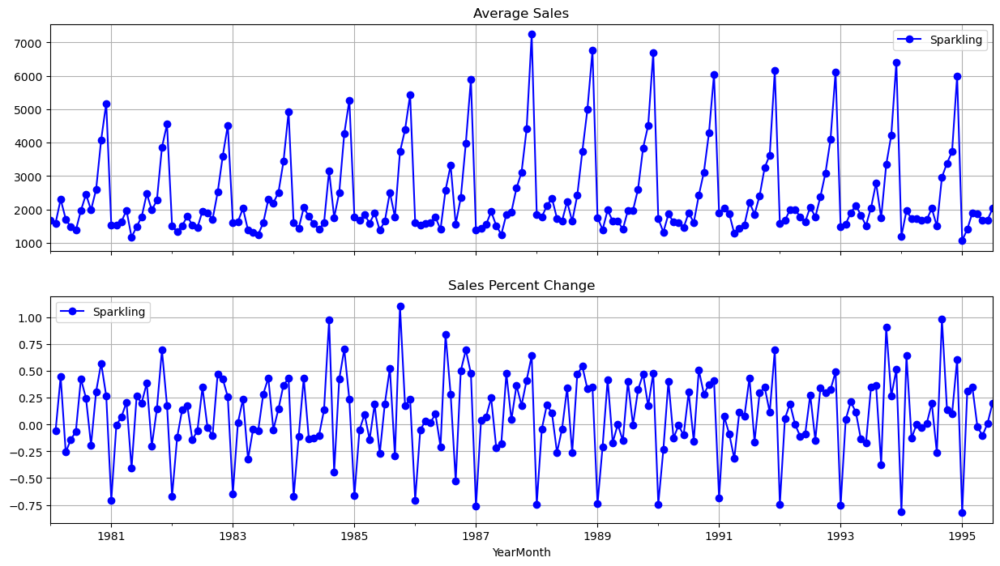

In [525]:
# Group by date and get average RetailSales, and percent change
average = df2.groupby(df2.index)["Sparkling"].mean()
pct_change = df2.groupby(df2.index)["Sparkling"].sum().pct_change()

fig, (axis1, axis2) = plt.subplots(2, 1, sharex=True, figsize=(15, 8))

# Plot average RetailSales over time (year-month)
ax1 = average.plot(legend=True, ax=axis1, marker='o', title="Average Sales", grid=True,color='blue')
ax1.set_xticks(range(len(average)))
ax1.set_xticklabels(average.index.tolist())

# Plot percent change for RetailSales over time (year-month)
ax2 = pct_change.plot(
    legend=True, 
    ax=axis2, 
    marker='o', 
    colormap="summer", 
    title="Sales Percent Change", 
    grid=True,
    color='blue'
)

plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp-fig5.jpg")

# Data Pre-processing

In [527]:
df1.isnull().sum()

Rose    2
dtype: int64

In [528]:
df1[df1['Rose'].isna()]

,Rose
YearMonth,
1994-07-01,NaN
1994-08-01,NaN


In [529]:
df1.reset_index(drop=True)

,Rose
0,112.0
1,118.0
2,129.0
3,99.0
4,116.0
...,...
182,45.0
183,52.0
184,28.0
185,40.0


In [530]:
df1.fillna(method='ffill',inplace=True)
df1.isnull().sum()

Rose    0
dtype: int64

In [531]:
df2.isnull().sum()

Sparkling    0
dtype: int64

## Perform Decomposition

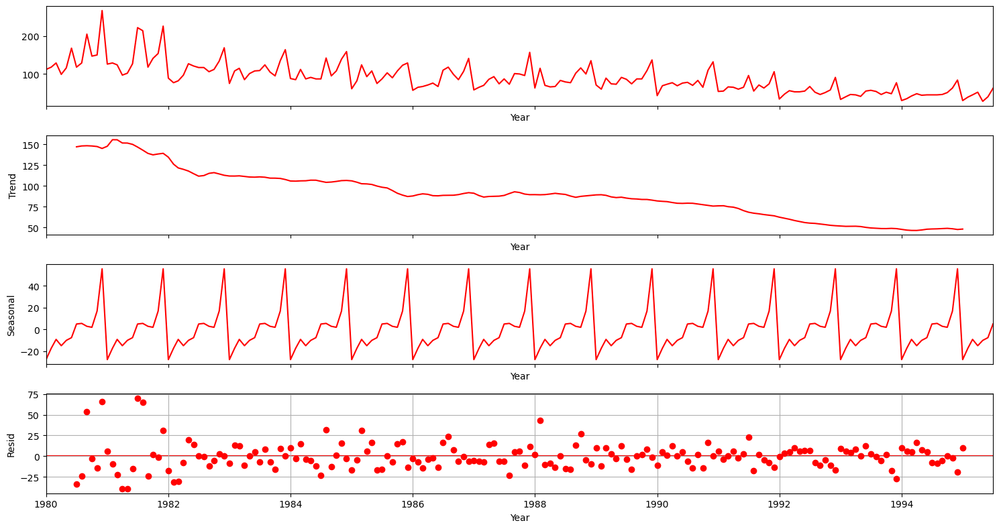

In [533]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition=seasonal_decompose(df1,model='additive',period=12)
# Plot with custom styling
fig = decomposition.plot()
plt.setp(fig.axes, xlabel='Year')  # Customize x-axis label

# Change line colors (modify each subplot individually)
for ax in fig.axes:
    for line in ax.get_lines():
        line.set_color('red')  # Set line color to red

plt.tight_layout()  # Prevent label overlap
plt.grid()
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose4.jpg")

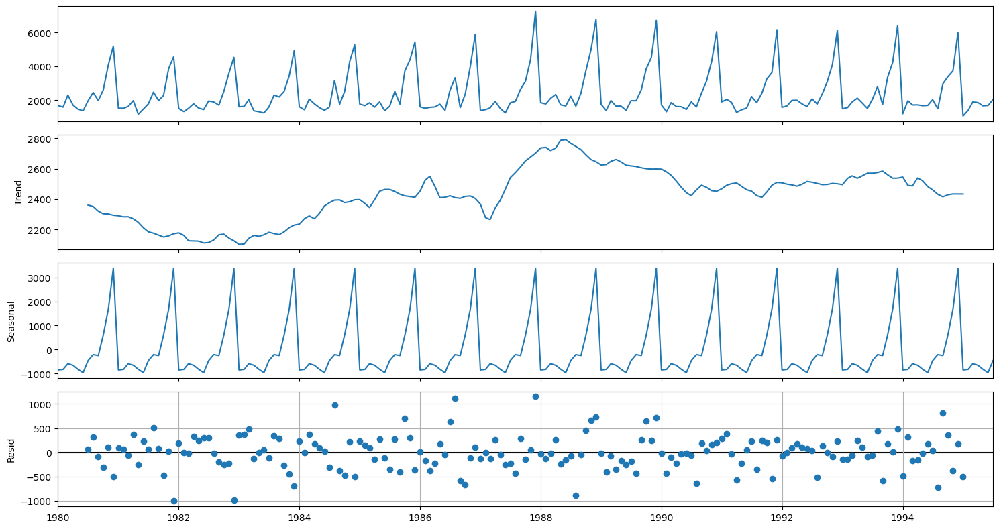

In [534]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition=seasonal_decompose(df2,model='additive',period=12)
decomposition.plot();

plt.tight_layout()  # Prevent label overlap
plt.grid()
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp4.jpg")

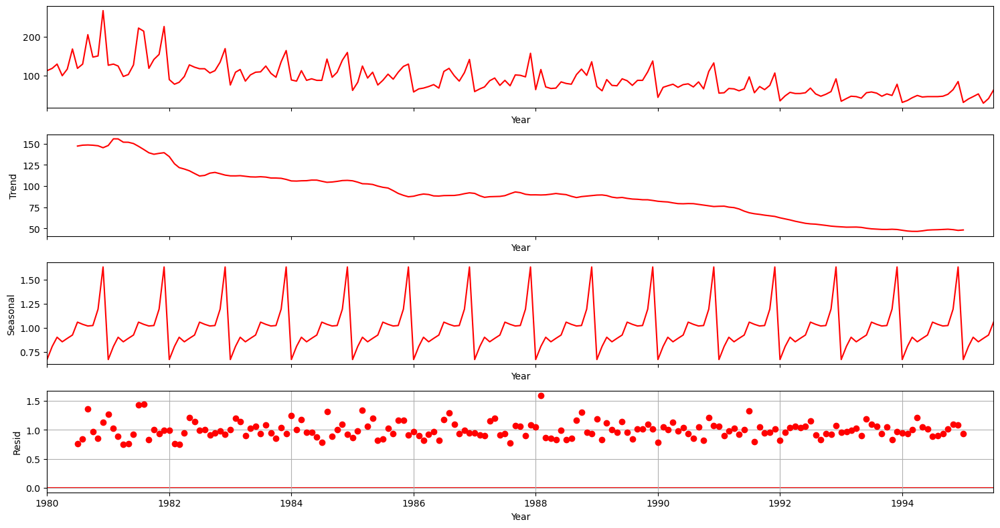

In [535]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition=seasonal_decompose(df1,model='multiplicative',period=12)
# Plot with custom styling
fig = decomposition.plot()
plt.setp(fig.axes, xlabel='Year')  # Customize x-axis label

# Change line colors (modify each subplot individually)
for ax in fig.axes:
    for line in ax.get_lines():
        line.set_color('red')  # Set line color to red

plt.tight_layout()  # Prevent label overlap
plt.grid()
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose5.jpg")

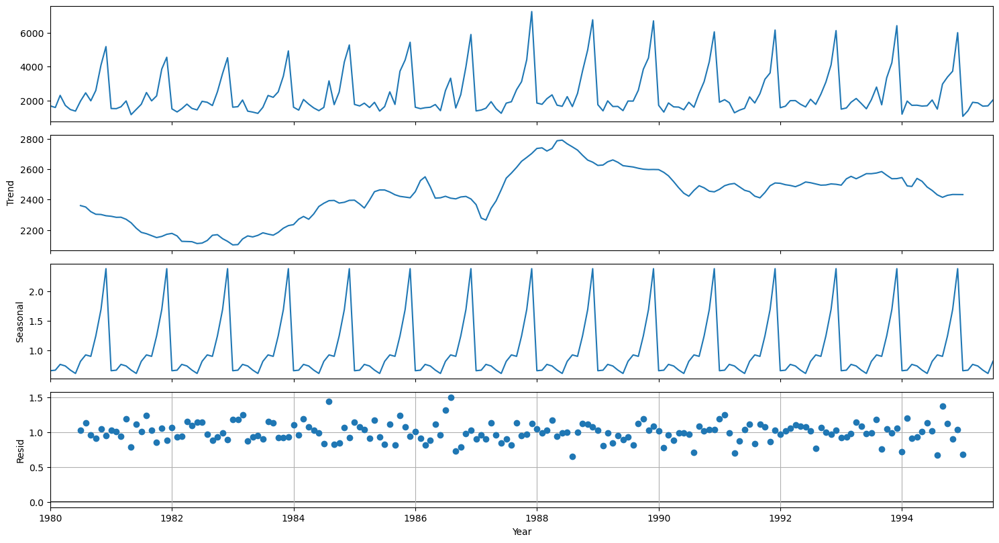

In [536]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition=seasonal_decompose(df2,model='multiplicative',period=12)
decomposition.plot();

plt.tight_layout()  # Prevent label overlap
plt.grid()
plt.xlabel('Year')
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp5.jpg")

In [537]:
trend = decomposition.trend
resid = decomposition.resid
seasonality = decomposition.seasonal

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',resid.head(12),'\n')

Trend 
 YearMonth
1980-01-01            NaN
1980-02-01            NaN
1980-03-01            NaN
1980-04-01            NaN
1980-05-01            NaN
1980-06-01            NaN
1980-07-01    2360.666667
1980-08-01    2351.333333
1980-09-01    2320.541667
1980-10-01    2303.583333
1980-11-01    2302.041667
1980-12-01    2293.791667
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-01    0.649843
1980-02-01    0.659214
1980-03-01    0.757440
1980-04-01    0.730351
1980-05-01    0.660609
1980-06-01    0.603468
1980-07-01    0.809164
1980-08-01    0.918822
1980-09-01    0.894367
1980-10-01    1.241789
1980-11-01    1.690158
1980-12-01    2.384776
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-01         NaN
1980-02-01         NaN
1980-03-01         NaN
1980-04-01         NaN
1980-05-01         NaN
1980-06-01         NaN
1980-07-01    1.029230
1980-08-01    1.135407
1980-09-01    0.955954
1980-10-01    0.907513
1980-11-01    1.050423
1980-12-01    0.946770
Name: resi

In [538]:
train = df1[:int(len(df1)*0.7)]
test = df1[int(len(df1)*0.7):]
print(train.tail())
print(test.head())

            Rose
YearMonth       
1990-06-01  76.0
1990-07-01  78.0
1990-08-01  70.0
1990-09-01  83.0
1990-10-01  65.0
             Rose
YearMonth        
1990-11-01  110.0
1990-12-01  132.0
1991-01-01   54.0
1991-02-01   55.0
1991-03-01   66.0


In [539]:
train_2 = df2[:int(len(df2)*0.7)]
test_2 = df2[int(len(df2)*0.7):]
print(train_2.tail())
print(test_2.head())

            Sparkling
YearMonth            
1990-06-01       1457
1990-07-01       1899
1990-08-01       1605
1990-09-01       2424
1990-10-01       3116
            Sparkling
YearMonth            
1990-11-01       4286
1990-12-01       6047
1991-01-01       1902
1991-02-01       2049
1991-03-01       1874


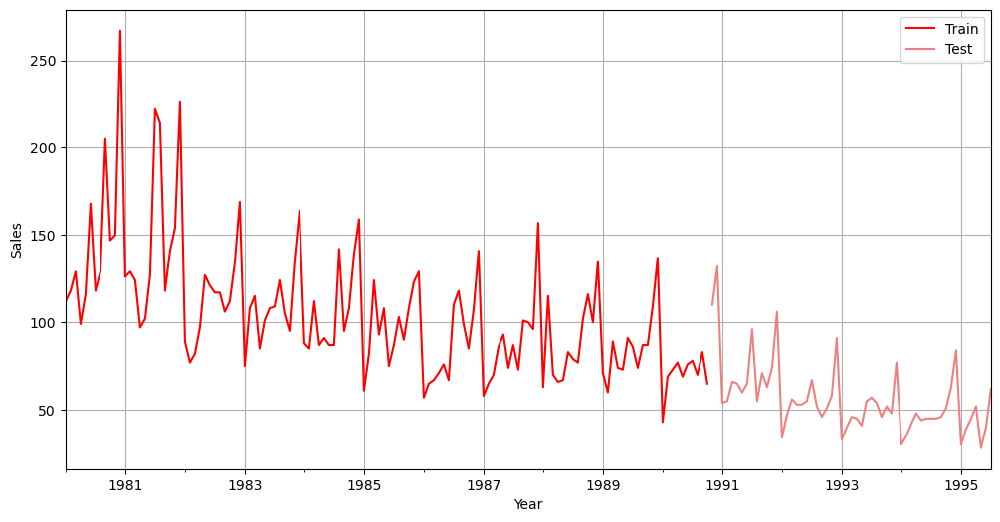

In [540]:
# Combine both plots in one figure
ax = train.plot(color='red', label='Train', figsize=(12,6))
test.plot(color='lightcoral', label='Test', ax=ax)  # ax=ax ensures same plot
plt.xlabel("Year")
plt.ylabel("Sales")
plt.legend(['Train','Test'])
plt.grid(True)
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose6.jpg")

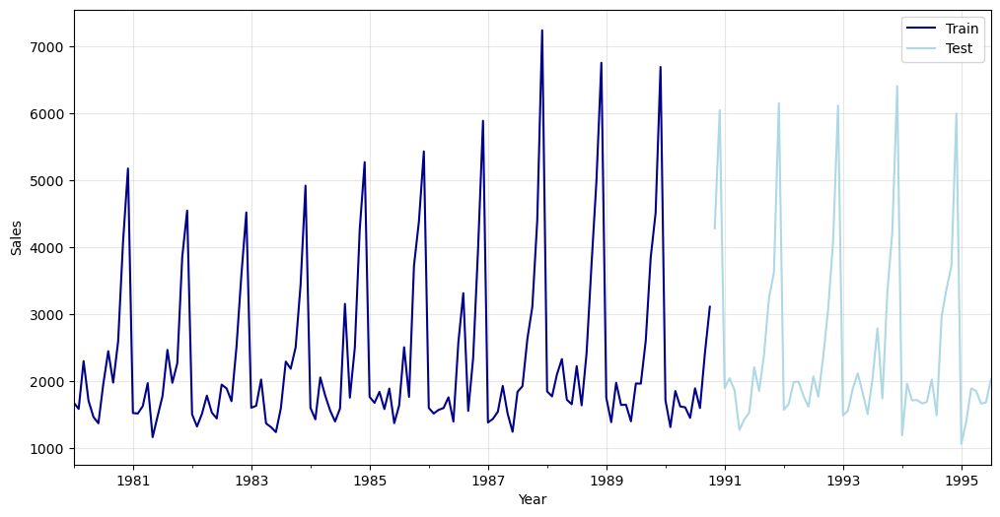

In [541]:
# Combine both plots in one figure
ax =train_2.plot(color='darkblue', label='Train', figsize=(12,6))
test_2.plot(color='lightblue', label='Test', ax=ax)  # ax=ax ensures same plot

# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.legend(['Train', 'Test'])
plt.grid(True, alpha=0.3)  # Added alpha for subtle grid

plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp6.jpg")

# Building different models and comparing the accuracy metrics.

## Model 1: Linear Regression

In [544]:
train_time = np.arange(1,int(len(df1)*0.7)+1,1)
test_time = np.arange(int(len(df1)*0.7)+1,int(len(df1))+1)
print('Training Time instance','\n',train_time)
print('Test Time instance','\n',test_time)

Training Time instance 
 [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130]
Test Time instance 
 [131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148
 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166
 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184
 185 186 187]


In [545]:
from sklearn.linear_model import LinearRegression
train_size = int(len(df1)*0.7)
# Create and fit the model
lr = LinearRegression()
# df1 = df1.reset_index(drop=True)
X_train = train_time[:train_size].reshape(-1, 1)  # Direct slicing for numpy
y_train = df1['Rose'].iloc[:train_size].values   # Convert to numpy

lr.fit(X_train, y_train)  # Fit model with proper data

# Make predictions on entire dataset
train['estimation'] = lr.predict(train_time.reshape(-1, 1))
test['estimation'] = lr.predict(test_time.reshape(-1, 1))

In [546]:
from sklearn.linear_model import LinearRegression
train_size = int(len(df2)*0.7)
# Create and fit the model
lr = LinearRegression()
# df1 = df1.reset_index(drop=True)
X_train = train_time[:train_size].reshape(-1, 1)  # Direct slicing for numpy
y_train = df2['Sparkling'].iloc[:train_size].values   # Convert to numpy

lr.fit(X_train, y_train)  # Fit model with proper data

# Make predictions on entire dataset
train_2['estimation'] = lr.predict(train_time.reshape(-1, 1))
test_2['estimation'] = lr.predict(test_time.reshape(-1, 1))

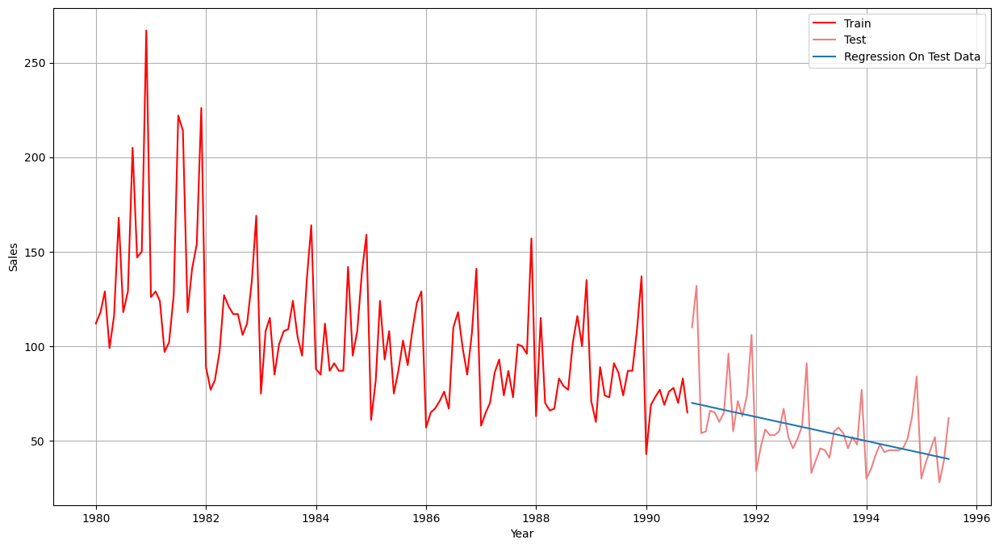

In [547]:
plt.plot( train['Rose'], label='Train',color='red')
plt.plot(test['Rose'], label='Test',color='lightcoral')
plt.plot(test['estimation'], label='Regression On Test Data')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose7.jpg")

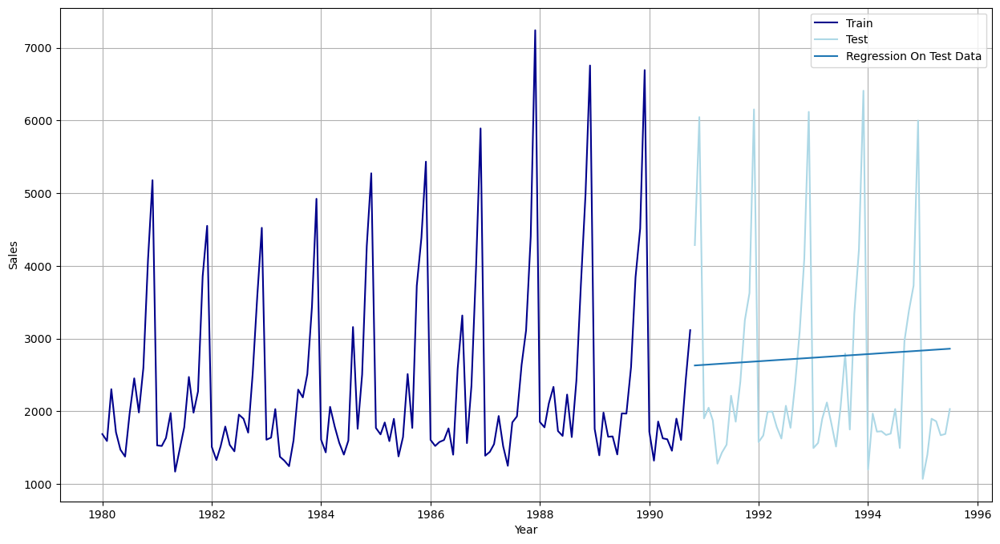

In [548]:
plt.plot( train_2['Sparkling'], label='Train',color='darkblue')
plt.plot(test_2['Sparkling'], label='Test',color='lightblue')
plt.plot(test_2['estimation'], label='Regression On Test Data')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp7.jpg")

### Model Evaluation

In [550]:
rmse_LR_Model_rose = mse(test['Rose'],test['estimation'],squared=False)
print("For RegressionOnTime forecast on the Test Data,  RMSE is %3.3f " %(rmse_LR_Model_rose))
rose_df = pd.DataFrame({'Test RMSE(Rose)': [rmse_LR_Model_rose]},index=['Linear_Regression'])


For RegressionOnTime forecast on the Test Data,  RMSE is 17.357 


In [551]:
rmse_LR_Model_sp = mse(test_2['Sparkling'],test_2['estimation'],squared=False)
print("For RegressionOnTime forecast on the Test Data,  RMSE is %3.3f " %(rmse_LR_Model_sp))
sparkling_df = pd.DataFrame({'Test RMSE(Sparkling)': [rmse_LR_Model_sp]},index=['Linear_Regression'])


For RegressionOnTime forecast on the Test Data,  RMSE is 1392.438 


In [552]:
results1 = pd.concat([rose_df,sparkling_df],axis=1)
results1

,Test RMSE(Rose),Test RMSE(Sparkling)
Linear_Regression,17.356924,1392.438305


## Method 2: Simple Average

For this particular simple average method, we will forecast by using the average of the training values.

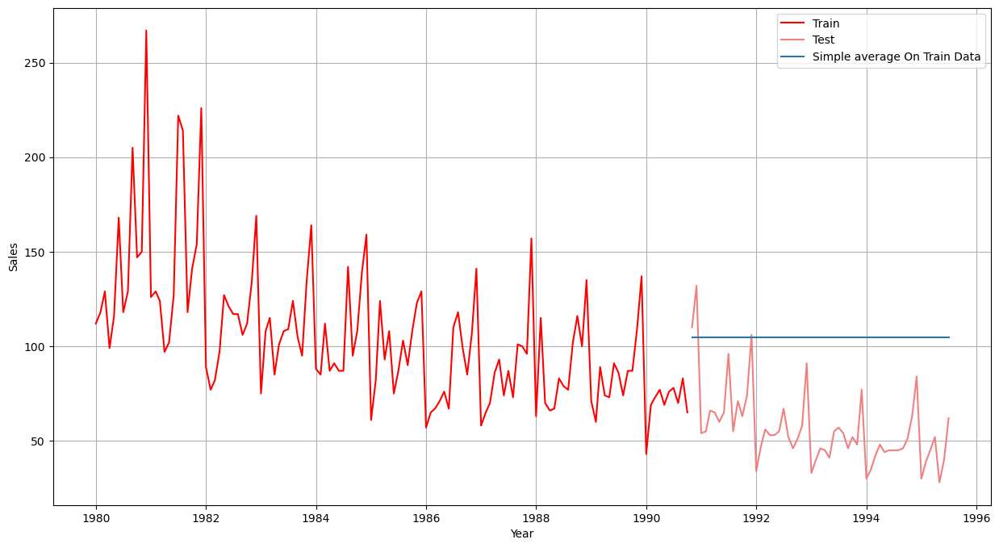

In [555]:
test['estimation2'] = train['Rose'].mean()
test_2['estimation2'] = train_2['Sparkling'].mean()


plt.plot( train['Rose'], label='Train',color='red')
plt.plot(test['Rose'], label='Test',color='lightcoral')
plt.plot(test['estimation2'], label='Simple average On Train Data')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose8.jpg")

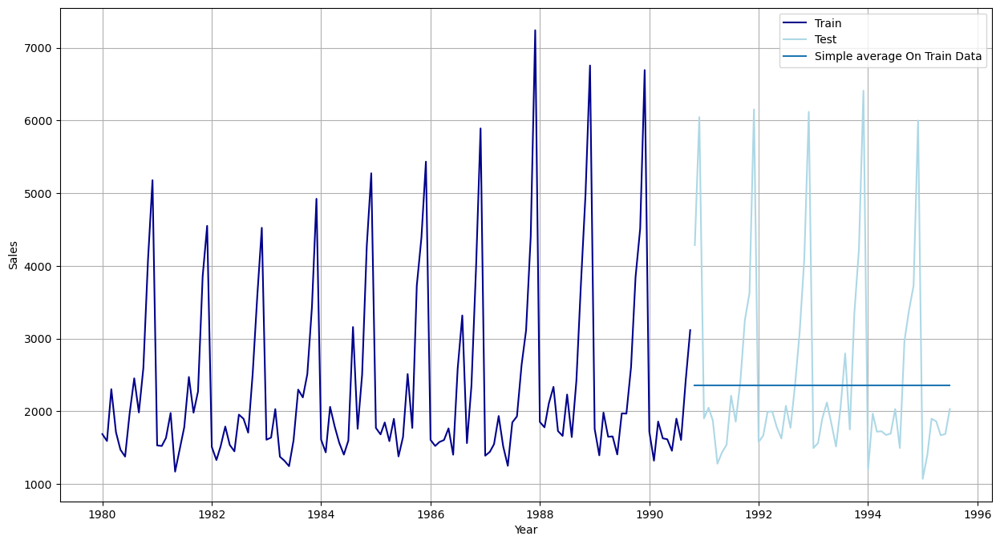

In [556]:
plt.plot( train_2['Sparkling'], label='Train',color='darkblue')
plt.plot(test_2['Sparkling'], label='Test',color='lightblue')
plt.plot(test_2['estimation2'], label='Simple average On Train Data')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp8.jpg")

### Model Evaluation

In [558]:
rmse_SA_Model_rose = mse(test['Rose'],test['estimation2'],squared=False)
print("For Simple average On Train Data,  RMSE is %3.3f " %(rmse_SA_Model_rose))
rose_df = pd.DataFrame({'Test RMSE(Rose)': [rmse_SA_Model_rose]},index=['Simple_Average'])


For Simple average On Train Data,  RMSE is 52.432 


In [559]:
rmse_SA_Model_sp = mse(test_2['Sparkling'],test_2['estimation2'],squared=False)
print("For Simple average On Train Data,  RMSE is %3.3f " %(rmse_SA_Model_sp))
sparkling_df = pd.DataFrame({'Test RMSE(Sparkling)': [rmse_SA_Model_sp]},index=['Simple_Average'])


For Simple average On Train Data,  RMSE is 1368.747 


In [560]:
results2 = pd.concat([rose_df,sparkling_df],axis=1)
results2

,Test RMSE(Rose),Test RMSE(Sparkling)
Simple_Average,52.431977,1368.746717


## Method 4: Moving Average(MA)

#### For the moving average model, we are going to calculate rolling means (or moving averages) for different intervals. The best interval can be determined by the maximum accuracy (or the minimum error) over here.

###### For Moving Average, we are going to average over the entire data.

In [563]:
ma =df1.copy()
ma2 =df2.copy()
point_avg=[]
for i in np.arange(2,10):
    point_avg.append(f'{i}_point_avg')
    ma[f'{i}_point_avg'] = ma['Rose'].rolling(i).mean()
    ma2[f'{i}_point_avg'] = ma2['Sparkling'].rolling(i).mean()

In [564]:
ma

,Rose,2_point_avg,3_point_avg,4_point_avg,5_point_avg,6_point_avg,7_point_avg,8_point_avg,9_point_avg
YearMonth,,,,,,,,,
1980-01-01,112.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-02-01,118.0,115.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-03-01,129.0,123.5,119.666667,NaN,NaN,NaN,NaN,NaN,NaN
1980-04-01,99.0,114.0,115.333333,114.50,NaN,NaN,NaN,NaN,NaN
1980-05-01,116.0,107.5,114.666667,115.50,114.8,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
1995-03-01,45.0,42.0,38.000000,49.50,52.2,52.000000,51.142857,50.375,49.777778
1995-04-01,52.0,48.5,45.333333,41.50,50.0,52.166667,52.000000,51.250,50.555556
1995-05-01,28.0,40.0,41.666667,41.00,38.8,46.333333,48.714286,49.000,48.666667


### Model Evaluation

In [566]:
# Split data into train and test
train_ma = ma.iloc[0:int(len(ma)*0.7)]
test_ma = ma.iloc[int(len(ma)*0.7):]
train_2_ma = ma2.iloc[0:int(len(ma2)*0.7)]
test_2_ma = ma2.iloc[int(len(ma2)*0.7):]

# Initialize results storage
results = []

# Calculate RMSE for different moving averages
for i in np.arange(2, 10):
    # For Rose dataset
    rmse_rose = mse(test_ma['Rose'], test_ma[f'{i}_point_avg'], squared=False)
    
    # For Sparkling dataset
    rmse_sparkling = mse(test_2_ma['Sparkling'], test_2_ma[f'{i}_point_avg'], squared=False)
    
    # Print results
    print(f"For {i}-point Moving Average:")
    print(f"  Rose RMSE: {rmse_rose:.3f}")
    print(f"  Sparkling RMSE: {rmse_sparkling:.3f}")
    print("-" * 30)
    
    # Store results
    results.append({
        'Window_Size': i,
        'Dataset': 'Rose',
        'RMSE': rmse_rose
    })
    results.append({
        'Window_Size': i,
        'Dataset': 'Sparkling',
        'RMSE': rmse_sparkling
    })

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Pivot for better visualization
final_results = results_df.pivot(index='Window_Size', columns='Dataset', values='RMSE')
print("\nFinal Results:")
print(final_results)

# Find the model with least RMSE for each dataset
best_rose = results_df[results_df['Dataset'] == 'Rose'].nsmallest(1, 'RMSE')
best_sparkling = results_df[results_df['Dataset'] == 'Sparkling'].nsmallest(1, 'RMSE')

# Create results3 DataFrame
results3 = pd.DataFrame({
    'Test RMSE(Rose)': [best_rose['RMSE'].values[0]],
    'Test RMSE(Sparkling)': [best_sparkling['RMSE'].values[0]],
}, index=['Moving_Average'])

print("\nBest Performing Models:")
results3

For 2-point Moving Average:
  Rose RMSE: 11.801
  Sparkling RMSE: 811.179
------------------------------
For 3-point Moving Average:
  Rose RMSE: 14.769
  Sparkling RMSE: 1040.067
------------------------------
For 4-point Moving Average:
  Rose RMSE: 15.371
  Sparkling RMSE: 1184.213
------------------------------
For 5-point Moving Average:
  Rose RMSE: 15.647
  Sparkling RMSE: 1276.589
------------------------------
For 6-point Moving Average:
  Rose RMSE: 15.867
  Sparkling RMSE: 1337.201
------------------------------
For 7-point Moving Average:
  Rose RMSE: 16.457
  Sparkling RMSE: 1393.366
------------------------------
For 8-point Moving Average:
  Rose RMSE: 16.342
  Sparkling RMSE: 1412.787
------------------------------
For 9-point Moving Average:
  Rose RMSE: 16.345
  Sparkling RMSE: 1422.653
------------------------------

Final Results:
Dataset           Rose    Sparkling
Window_Size                        
2            11.801167   811.178937
3            14.769245  1040.

,Test RMSE(Rose),Test RMSE(Sparkling)
Moving_Average,11.801167,811.178937


In [567]:
final_results

Dataset,Rose,Sparkling
Window_Size,,
2,11.801167,811.178937
3,14.769245,1040.067324
4,15.370676,1184.213295
5,15.647319,1276.589323
6,15.867384,1337.200524
7,16.456661,1393.366184
8,16.341787,1412.787236
9,16.345032,1422.653281


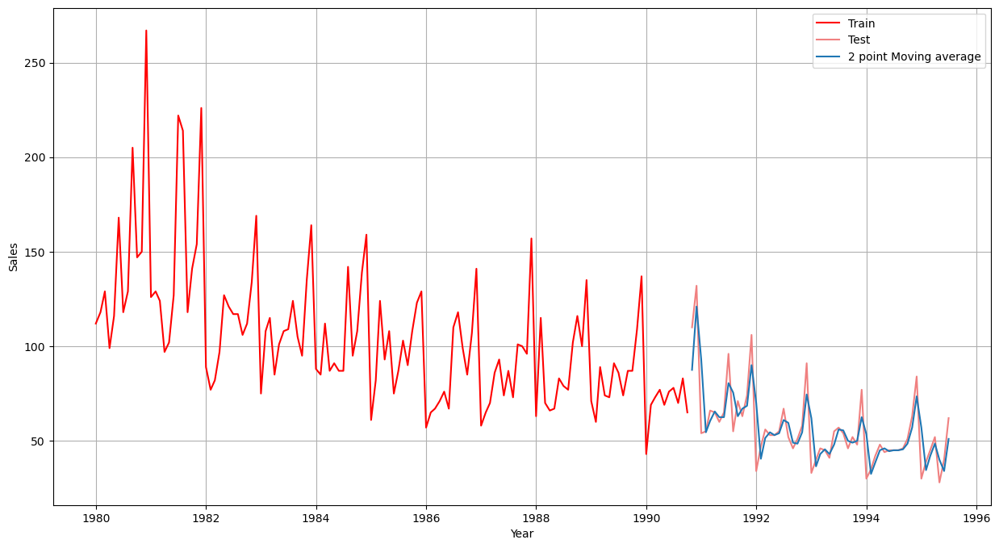

In [568]:
plt.plot( train_ma['Rose'], label='Train',color='red')
plt.plot(test_ma['Rose'], label='Test',color='lightcoral')
plt.plot(test_ma['2_point_avg'], label='2 point Moving average')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose9.jpg")

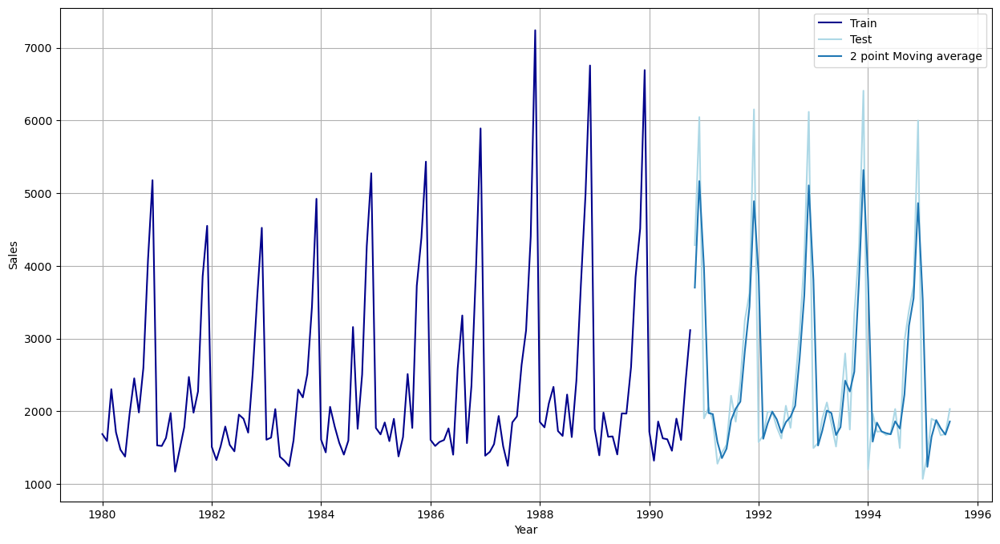

In [569]:
plt.plot( train_2_ma['Sparkling'], label='Train',color='darkblue')
plt.plot(test_2_ma['Sparkling'], label='Test',color='lightblue')
plt.plot(test_2_ma['2_point_avg'], label='2 point Moving average')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp9.jpg")

## Simple Exponential Smoothing, Holt's Model (Double Exponential Smoothing) & Holt-Winter's Model (Triple Exponential Smoothing)

### Exponential Smoothing methods
#####  Exponential smoothing methods consist of flattening time series data. 
##### Exponential smoothing averages or exponentially weighted moving averages consist of forecast based on previous periods data with exponentially declining influence on the older observations.
##### Exponential smoothing methods consist of special case exponential moving with notation ETS (Error, Trend, Seasonality) where each can be none(N), additive (N), additive damped (Ad), Multiplicative (M) or multiplicative damped (Md).
##### One or more parameters control how fast the weights decay.
##### These parameters have values between 0 and 1


### SES -  ETS(A, N, N) - Simple Exponential Smoothing with additive errors
###### The simplest of the exponentially smoothing methods is naturally called simple exponential smoothing (SES). 
###### This method is suitable for forecasting data with no clear trend or seasonal pattern.
In Single ES, the forecast at time (t + 1) is given by Winters,1960

* $F_{t+1} = \alpha Y_t + (1-\alpha) F_t$

Parameter $\alpha$ is called the smoothing constant and its value lies between 0 and 1.
Since the model uses only one smoothing constant, it is called Single Exponential Smoothing.

###### Note: Here, there is both trend and seasonality in the data. So, we should have directly gone for the Triple Exponential Smoothing but Simple Exponential Smoothing and the Double Exponential Smoothing models are built over here to get an idea of how the three types of models compare in this case.

In [573]:


model_SES = SimpleExpSmoothing(train['Rose'],initialization_method='estimated')
# Fitting the Simple Exponential Smoothing model and asking python to choose the optimal parameters
model_SES_autofit = model_SES.fit(optimized=True)
## Let us check the parameters

model_SES_autofit.params

{'smoothing_level': 0.10272100898511088,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 134.2627870419287,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [574]:


model_SES_sp = SimpleExpSmoothing(train_2['Sparkling'],initialization_method='estimated')
# Fitting the Simple Exponential Smoothing model and asking python to choose the optimal parameters
model_SES_autofit_sp = model_SES_sp.fit(optimized=True)
## Let us check the parameters

model_SES_autofit_sp.params

{'smoothing_level': 0.06994041702168571,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 2108.034139790532,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [575]:
test['estimation3']=model_SES_autofit.forecast(steps=len(test))
test['estimation3']

YearMonth
1990-11-01    78.899524
1990-12-01    78.899524
1991-01-01    78.899524
1991-02-01    78.899524
1991-03-01    78.899524
1991-04-01    78.899524
1991-05-01    78.899524
1991-06-01    78.899524
1991-07-01    78.899524
1991-08-01    78.899524
1991-09-01    78.899524
1991-10-01    78.899524
1991-11-01    78.899524
1991-12-01    78.899524
1992-01-01    78.899524
1992-02-01    78.899524
1992-03-01    78.899524
1992-04-01    78.899524
1992-05-01    78.899524
1992-06-01    78.899524
1992-07-01    78.899524
1992-08-01    78.899524
1992-09-01    78.899524
1992-10-01    78.899524
1992-11-01    78.899524
1992-12-01    78.899524
1993-01-01    78.899524
1993-02-01    78.899524
1993-03-01    78.899524
1993-04-01    78.899524
1993-05-01    78.899524
1993-06-01    78.899524
1993-07-01    78.899524
1993-08-01    78.899524
1993-09-01    78.899524
1993-10-01    78.899524
1993-11-01    78.899524
1993-12-01    78.899524
1994-01-01    78.899524
1994-02-01    78.899524
1994-03-01    78.899524
1994-0

In [576]:
test_2['estimation3']=model_SES_autofit_sp.forecast(steps=len(test))
test_2['estimation3']

YearMonth
1990-11-01    2429.666331
1990-12-01    2429.666331
1991-01-01    2429.666331
1991-02-01    2429.666331
1991-03-01    2429.666331
1991-04-01    2429.666331
1991-05-01    2429.666331
1991-06-01    2429.666331
1991-07-01    2429.666331
1991-08-01    2429.666331
1991-09-01    2429.666331
1991-10-01    2429.666331
1991-11-01    2429.666331
1991-12-01    2429.666331
1992-01-01    2429.666331
1992-02-01    2429.666331
1992-03-01    2429.666331
1992-04-01    2429.666331
1992-05-01    2429.666331
1992-06-01    2429.666331
1992-07-01    2429.666331
1992-08-01    2429.666331
1992-09-01    2429.666331
1992-10-01    2429.666331
1992-11-01    2429.666331
1992-12-01    2429.666331
1993-01-01    2429.666331
1993-02-01    2429.666331
1993-03-01    2429.666331
1993-04-01    2429.666331
1993-05-01    2429.666331
1993-06-01    2429.666331
1993-07-01    2429.666331
1993-08-01    2429.666331
1993-09-01    2429.666331
1993-10-01    2429.666331
1993-11-01    2429.666331
1993-12-01    2429.666331
19

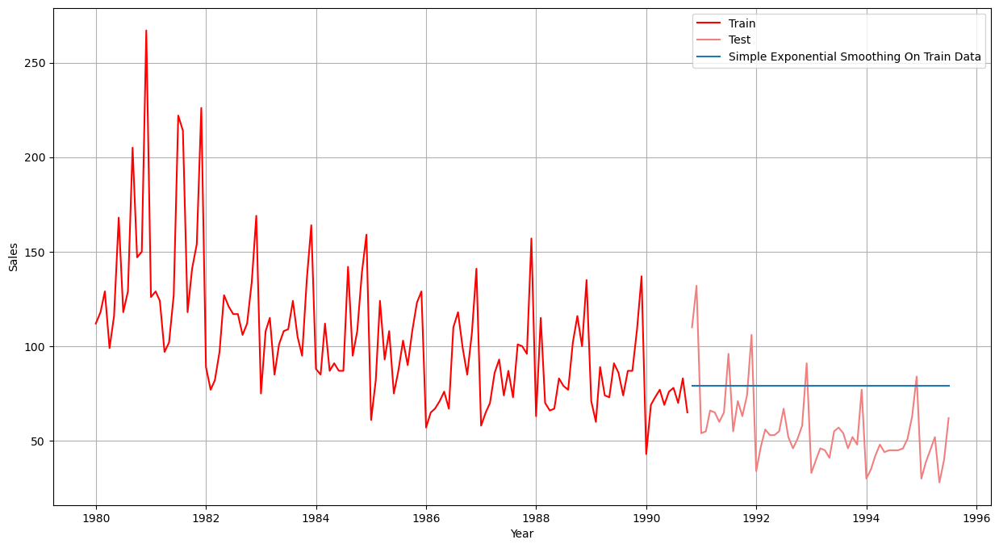

In [577]:
plt.plot( train['Rose'], label='Train',color='red')
plt.plot(test['Rose'], label='Test',color='lightcoral')
plt.plot(test['estimation3'], label='Simple Exponential Smoothing On Train Data')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose10.jpg")

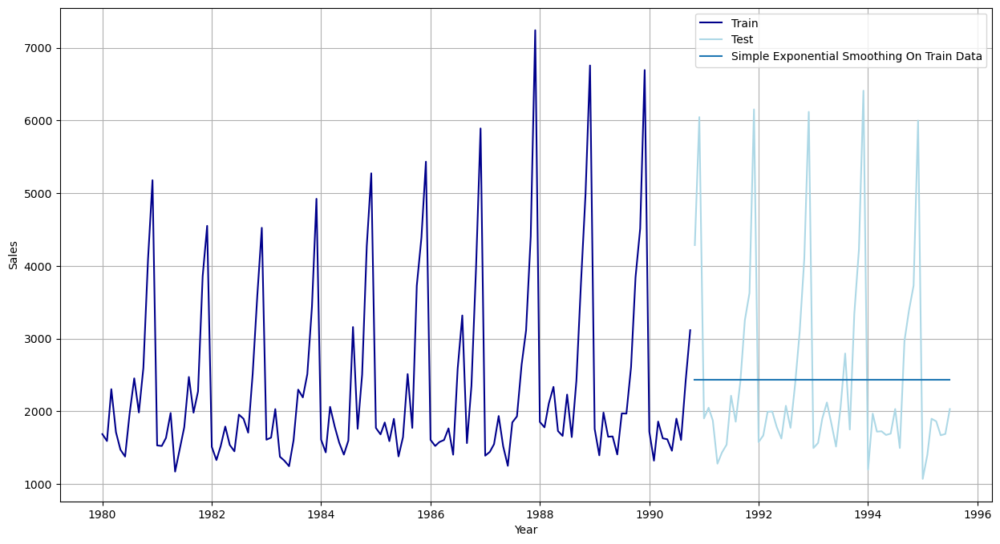

In [578]:
plt.plot( train_2['Sparkling'], label='Train',color='darkblue')
plt.plot(test_2['Sparkling'], label='Test',color='lightblue')
plt.plot(test_2['estimation3'], label='Simple Exponential Smoothing On Train Data')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp10.jpg")

### Model Evaluation

In [580]:
rmse_SES_Model_rose = mse(test['Rose'],test['estimation3'],squared=False)
print("For Simple Exponential Smoothing On Train Data,  RMSE is %3.3f " %(rmse_SES_Model_rose))
rose_df = pd.DataFrame({'Test RMSE(Rose)': [rmse_SES_Model_rose]},index=['Simple Exponential Smoothing'])

rmse_SES_Model_sp = mse(test_2['Sparkling'],test_2['estimation3'],squared=False)
print("For Simple Exponential Smoothing On Train Data,  RMSE is %3.3f " %(rmse_SES_Model_sp))
sparkling_df = pd.DataFrame({'Test RMSE(Sparkling)': [rmse_SES_Model_sp]},index=['Simple Exponential Smoothing'])

results4 = pd.concat([rose_df,sparkling_df],axis=1)
results4

For Simple Exponential Smoothing On Train Data,  RMSE is 30.208 
For Simple Exponential Smoothing On Train Data,  RMSE is 1363.702 


,Test RMSE(Rose),Test RMSE(Sparkling)
Simple Exponential Smoothing,30.207858,1363.702251


In [581]:
results=pd.concat([results1,results2,results3,results4],axis=0)
results

,Test RMSE(Rose),Test RMSE(Sparkling)
Linear_Regression,17.356924,1392.438305
Simple_Average,52.431977,1368.746717
Moving_Average,11.801167,811.178937
Simple Exponential Smoothing,30.207858,1363.702251


## Holt - ETS(A, A, N) - Holt's linear method with additive errors

## Double Exponential Smoothing

* One of the drawbacks of the simple exponential smoothing is that the model does not do well in the presence of the trend.
* This model is an extension of SES known as Double Exponential model which estimates two smoothing parameters.
* Applicable when data has Trend but no seasonality.
* Two separate components are considered: Level and Trend.
* Level is the local mean.
* One smoothing parameter α corresponds to the level series
* A second smoothing parameter β corresponds to the trend series.

**Double Exponential Smoothing uses two equations to forecast future values of the time series, one for forecating the short term avarage value or level and the other for capturing the trend.**

* Intercept or Level equation, $L_t$ is given by:
$L_t = {\alpha}{Y_t}  + (1 - \alpha)F_t$ 

* Trend equation is given by 
$T_t = {\beta}{(L_t - L_{t-1})}  + (1 - \beta)T_{t-1}$ 

Here, $\alpha$ and $\beta$ are the smoothing constants for level and trend, respectively, 
* 0 <$\alpha$ < 1 and 0 < $\beta$ < 1.

The forecast at time t + 1 is given by
* $F_{t+1} = L_t + T_t$
* $F_{t+n} = L_t + nT_t$

In [584]:
model_DES = Holt(train['Rose'],initialization_method='estimated')
model_DES_autofit=model_DES.fit(optimized=True)
## Let us check the parameters

model_DES_autofit.params

{'smoothing_level': 1.4901161193847656e-08,
 'smoothing_trend': 7.755984441513712e-11,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 139.3527819489728,
 'initial_trend': -0.5291705700335453,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [585]:
model_DES_sp = Holt(train_2['Sparkling'],initialization_method='estimated')
# Fitting the Simple Exponential Smoothing model and asking python to choose the optimal parameters
model_DES_autofit_sp = model_DES_sp.fit(optimized=True)
## Let us check the parameters

model_DES_autofit_sp.params

{'smoothing_level': 0.07614001422051413,
 'smoothing_trend': 0.07614001422051413,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 1505.800070851357,
 'initial_trend': 2.7690564419590373,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [586]:
test['estimation4']=model_DES_autofit.forecast(steps=len(test))
test['estimation4']

YearMonth
1990-11-01    70.031437
1990-12-01    69.502267
1991-01-01    68.973096
1991-02-01    68.443926
1991-03-01    67.914755
1991-04-01    67.385584
1991-05-01    66.856414
1991-06-01    66.327243
1991-07-01    65.798073
1991-08-01    65.268902
1991-09-01    64.739732
1991-10-01    64.210561
1991-11-01    63.681390
1991-12-01    63.152220
1992-01-01    62.623049
1992-02-01    62.093879
1992-03-01    61.564708
1992-04-01    61.035538
1992-05-01    60.506367
1992-06-01    59.977196
1992-07-01    59.448026
1992-08-01    58.918855
1992-09-01    58.389685
1992-10-01    57.860514
1992-11-01    57.331344
1992-12-01    56.802173
1993-01-01    56.273002
1993-02-01    55.743832
1993-03-01    55.214661
1993-04-01    54.685491
1993-05-01    54.156320
1993-06-01    53.627150
1993-07-01    53.097979
1993-08-01    52.568808
1993-09-01    52.039638
1993-10-01    51.510467
1993-11-01    50.981297
1993-12-01    50.452126
1994-01-01    49.922956
1994-02-01    49.393785
1994-03-01    48.864614
1994-0

In [587]:
test_2['estimation4']=model_DES_autofit_sp.forecast(steps=len(test))
test_2['estimation4']

YearMonth
1990-11-01    2406.739632
1990-12-01    2390.171048
1991-01-01    2373.602464
1991-02-01    2357.033880
1991-03-01    2340.465296
1991-04-01    2323.896712
1991-05-01    2307.328128
1991-06-01    2290.759544
1991-07-01    2274.190960
1991-08-01    2257.622376
1991-09-01    2241.053792
1991-10-01    2224.485208
1991-11-01    2207.916624
1991-12-01    2191.348040
1992-01-01    2174.779456
1992-02-01    2158.210873
1992-03-01    2141.642289
1992-04-01    2125.073705
1992-05-01    2108.505121
1992-06-01    2091.936537
1992-07-01    2075.367953
1992-08-01    2058.799369
1992-09-01    2042.230785
1992-10-01    2025.662201
1992-11-01    2009.093617
1992-12-01    1992.525033
1993-01-01    1975.956449
1993-02-01    1959.387865
1993-03-01    1942.819281
1993-04-01    1926.250697
1993-05-01    1909.682113
1993-06-01    1893.113529
1993-07-01    1876.544946
1993-08-01    1859.976362
1993-09-01    1843.407778
1993-10-01    1826.839194
1993-11-01    1810.270610
1993-12-01    1793.702026
19

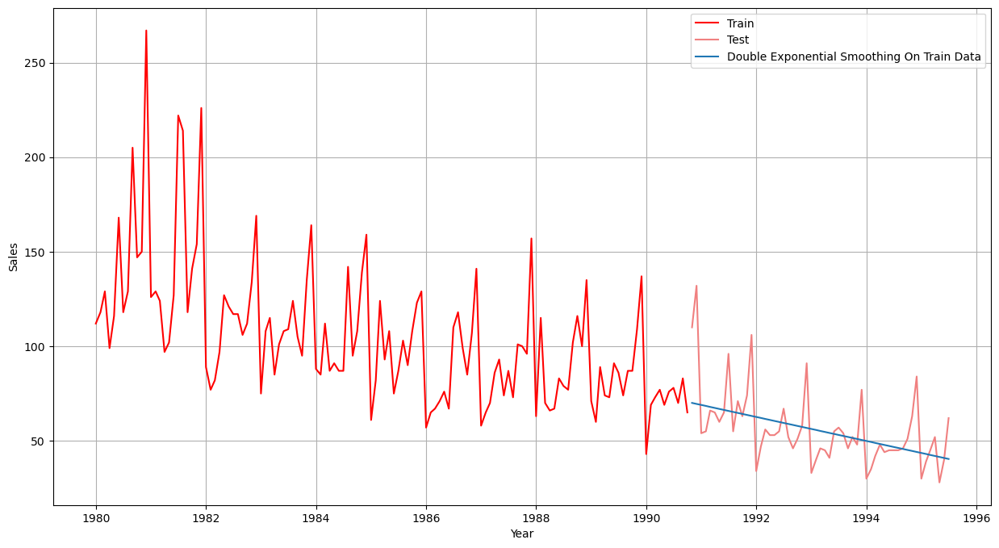

In [588]:
plt.plot( train['Rose'], label='Train',color='red')
plt.plot(test['Rose'], label='Test',color='lightcoral')
plt.plot(test['estimation4'], label='Double Exponential Smoothing On Train Data')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose11.jpg")




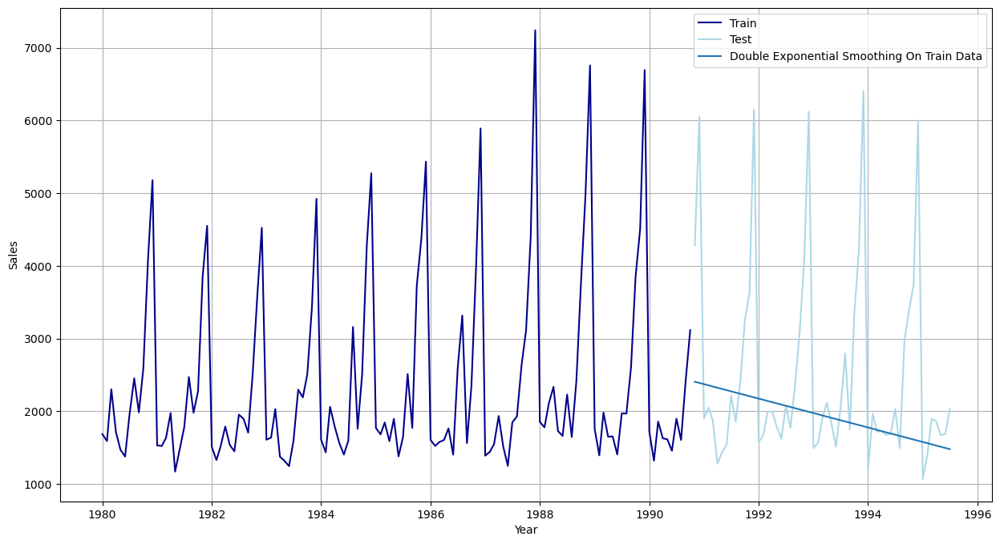

In [589]:
plt.plot( train_2['Sparkling'], label='Train',color='darkblue')
plt.plot(test_2['Sparkling'], label='Test',color='lightblue')
plt.plot(test_2['estimation4'], label='Double Exponential Smoothing On Train Data')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp11.jpg")

### Model Evaluation

In [591]:
rmse_DES_Model_rose = mse(test['Rose'],test['estimation4'],squared=False)
print("For Double Exponential Smoothing On Train Data,  RMSE is %3.3f " %(rmse_DES_Model_rose))
rose_df = pd.DataFrame({'Test RMSE(Rose)': [rmse_DES_Model_rose]},index=['Double Exponential Smoothing'])

rmse_DES_Model_sp = mse(test_2['Sparkling'],test_2['estimation4'],squared=False)
print("For Double Exponential Smoothing On Train Data,  RMSE is %3.3f " %(rmse_DES_Model_sp))
sparkling_df = pd.DataFrame({'Test RMSE(Sparkling)': [rmse_DES_Model_sp]},index=['Double Exponential Smoothing'])

results5 = pd.concat([rose_df,sparkling_df],axis=1)
results5

For Double Exponential Smoothing On Train Data,  RMSE is 17.357 
For Double Exponential Smoothing On Train Data,  RMSE is 1472.254 


,Test RMSE(Rose),Test RMSE(Sparkling)
Double Exponential Smoothing,17.356857,1472.253632


### Inference

Here, we see that the Double Exponential Smoothing has actually done well when compared to the Simple Exponential Smoothing. This is because of the fact that the Double Exponential Smoothing model has picked up the trend component as well.



### Holt-Winters - ETS(A, A, A) - Holt Winter's linear method with additive errors

# Holt-Winters ETS(A,A,A) Model

## Model Equations

### Smoothing Equations

**Level:**
$$
\ell_t = \alpha (y_t - s_{t-m}) + (1 - \alpha)(\ell_{t-1} + b_{t-1})
$$

**Trend:**
$$
b_t = \beta (\ell_t - \ell_{t-1}) + (1 - \beta) b_{t-1}
$$

**Seasonal:**
$$
s_t = \gamma (y_t - \ell_{t-1} - b_{t-1}) + (1 - \gamma) s_{t-m}
$$

### Forecast Equation
$$
\hat{y}_{t+h} = \ell_t + h \cdot b_t + s_{t+h-m \cdot k}
$$

Where:
- $m$ = seasonal period (e.g., 12 for monthly data)
- $k = \lfloor (h-1)/m \rfloor$



In [595]:
model_TES= ExponentialSmoothing(train['Rose'],trend='add',seasonal='add',initialization_method='estimated')
model_TES_autofit = model_TES.fit(optimized=True)
model_TES_autofit.params

{'smoothing_level': 0.0889188731139181,
 'smoothing_trend': 4.656525272079209e-06,
 'smoothing_seasonal': 0.0,
 'damping_trend': nan,
 'initial_level': 146.86076706887187,
 'initial_trend': -0.5555953323059539,
 'initial_seasons': array([-31.14573949, -18.77116887, -10.7601019 , -21.38589007,
        -12.55757961,  -7.09157308,   2.82817666,   8.93035772,
          4.94016583,   3.0419684 ,  19.65855714,  63.91429684]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [596]:
test['estimation5']=model_TES_autofit.forecast(len(test))
test['estimation5']

YearMonth
1990-11-01     93.671645
1990-12-01    137.371789
1991-01-01     41.756157
1991-02-01     53.575132
1991-03-01     61.030603
1991-04-01     49.849219
1991-05-01     58.121934
1991-06-01     63.032345
1991-07-01     72.396499
1991-08-01     77.943085
1991-09-01     73.397297
1991-10-01     70.943504
1991-11-01     87.004497
1991-12-01    130.704641
1992-01-01     35.089009
1992-02-01     46.907984
1992-03-01     54.363456
1992-04-01     43.182072
1992-05-01     51.454787
1992-06-01     56.365198
1992-07-01     65.729352
1992-08-01     71.275937
1992-09-01     66.730150
1992-10-01     64.276357
1992-11-01     80.337350
1992-12-01    124.037494
1993-01-01     28.421862
1993-02-01     40.240837
1993-03-01     47.696308
1993-04-01     36.514925
1993-05-01     44.787639
1993-06-01     49.698050
1993-07-01     59.062204
1993-08-01     64.608790
1993-09-01     60.063002
1993-10-01     57.609209
1993-11-01     73.670202
1993-12-01    117.370347
1994-01-01     21.754715
1994-02-01     

In [597]:
model_TES= ExponentialSmoothing(train_2['Sparkling'],trend='add',seasonal='add',initialization_method='estimated')
model_TES_autofit_sp = model_TES.fit(optimized=True)
model_TES_autofit_sp.params

{'smoothing_level': 0.07569306568824088,
 'smoothing_trend': 0.03243079354510322,
 'smoothing_seasonal': 0.47913593977130997,
 'damping_trend': nan,
 'initial_level': 2356.5265323809604,
 'initial_trend': -0.7790797250530854,
 'initial_seasons': array([-636.24268485, -722.99133041, -398.6335455 , -473.44377819,
        -808.44186271, -815.36460194, -384.23726708,   72.99614943,
        -237.4576044 ,  272.31934737, 1541.39471434, 2590.08838066]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [598]:
test_2['estimation5']=model_TES_autofit_sp.forecast(len(test))
test_2['estimation5']

YearMonth
1990-11-01    4497.227451
1990-12-01    6550.067144
1991-01-01    1620.057193
1991-02-01    1324.953921
1991-03-01    1806.743576
1991-04-01    1660.977944
1991-05-01    1567.775979
1991-06-01    1383.385229
1991-07-01    1904.698547
1991-08-01    1762.048314
1991-09-01    2403.586154
1991-10-01    3535.228751
1991-11-01    4490.836280
1991-12-01    6543.675973
1992-01-01    1613.666022
1992-02-01    1318.562750
1992-03-01    1800.352404
1992-04-01    1654.586773
1992-05-01    1561.384808
1992-06-01    1376.994057
1992-07-01    1898.307376
1992-08-01    1755.657143
1992-09-01    2397.194983
1992-10-01    3528.837580
1992-11-01    4484.445108
1992-12-01    6537.284801
1993-01-01    1607.274851
1993-02-01    1312.171578
1993-03-01    1793.961233
1993-04-01    1648.195601
1993-05-01    1554.993636
1993-06-01    1370.602886
1993-07-01    1891.916204
1993-08-01    1749.265971
1993-09-01    2390.803812
1993-10-01    3522.446408
1993-11-01    4478.053937
1993-12-01    6530.893630
19

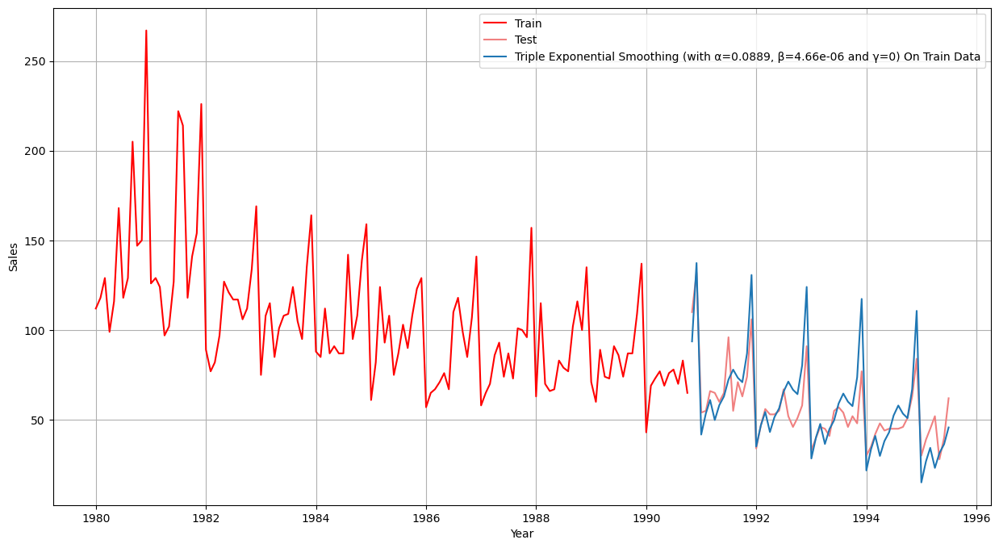

In [599]:
plt.plot( train['Rose'], label='Train',color='red')
plt.plot(test['Rose'], label='Test',color='lightcoral')
plt.plot(test['estimation5'], label='Triple Exponential Smoothing (with α=0.0889, β=4.66e-06 and γ=0) On Train Data')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose12.jpg")




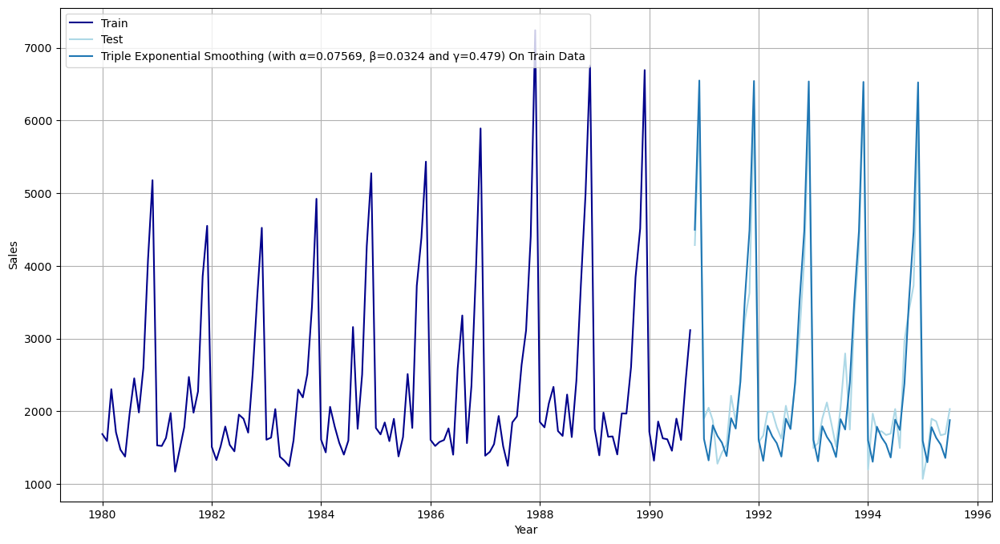

In [600]:
plt.plot( train_2['Sparkling'], label='Train',color='darkblue')
plt.plot(test_2['Sparkling'], label='Test',color='lightblue')
plt.plot(test_2['estimation5'], label='Triple Exponential Smoothing (with α=0.07569, β=0.0324 and γ=0.479) On Train Data')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp12.jpg")

### Model Evaluation

In [602]:
rmse_TES_Model_rose = mse(test['Rose'],test['estimation5'],squared=False)
print("For Triple Exponential Smoothing On Train Data,  RMSE is %3.3f " %(rmse_TES_Model_rose))
rose_df = pd.DataFrame({'Test RMSE(Rose)': [rmse_TES_Model_rose]},index=['Triple Exponential Smoothing (with α=0.0889, β=4.66e-06 and γ=0)'])

rmse_TES_Model_sp = mse(test_2['Sparkling'],test_2['estimation5'],squared=False)
print("For Double Exponential Smoothing On Train Data,  RMSE is %3.3f " %(rmse_TES_Model_sp))
sparkling_df = pd.DataFrame({'Test RMSE(Sparkling)': [rmse_TES_Model_sp]},index=['Triple Exponential Smoothing (with α=0.07569, β=0.0324 and γ=0.479)'])

results6 = pd.concat([rose_df,sparkling_df],axis=1)
results6

For Triple Exponential Smoothing On Train Data,  RMSE is 13.977 
For Double Exponential Smoothing On Train Data,  RMSE is 366.859 


,Test RMSE(Rose),Test RMSE(Sparkling)
"Triple Exponential Smoothing (with α=0.0889, β=4.66e-06 and γ=0)",13.976942,NaN
"Triple Exponential Smoothing (with α=0.07569, β=0.0324 and γ=0.479)",NaN,366.859156


### Inference

Triple Exponential Smoothing has performed the best on the test as expected since the data had both trend and seasonality. 

But we see that our triple exponential smoothing is under forecasting. Let us try to tweak some of the parameters in order to get a better forecast on the test set.

# Holt-Winters ETS(A,A,M) Model  
## (Additive Error, Additive Trend, Multiplicative Seasonality)  

---

## Model Equations  

### Smoothing Equations  

**Level:**  
$$
\ell_t = \alpha \left(\frac{y_t}{s_{t-m}}\right) + (1 - \alpha)(\ell_{t-1} + b_{t-1})  
$$  

**Trend:**  
$$
b_t = \beta (\ell_t - \ell_{t-1}) + (1 - \beta) b_{t-1}  
$$  

**Seasonal (Multiplicative):**  
$$
s_t = \gamma \left(\frac{y_t}{\ell_{t-1} + b_{t-1}}\right) + (1 - \gamma) s_{t-m}  
$$  

### Forecast Equation  
$$
\hat{y}_{t+h} = (\ell_t + h \cdot b_t) \times s_{t+h-m \cdot k}  
$$  

Where:
- $m$ = seasonal period (e.g., 12 for monthly data)
- $k = \lfloor (h-1)/m \rfloor$ (ensures correct seasonal component)

In [605]:
model_TES= ExponentialSmoothing(train['Rose'],trend='add',seasonal='mul',initialization_method='estimated')
model_TES_autofit_mul = model_TES.fit(optimized=True)
model_TES_autofit_mul.params

{'smoothing_level': 0.09954161352526007,
 'smoothing_trend': 1.3336303508710234e-09,
 'smoothing_seasonal': 1.2069328449342624e-07,
 'damping_trend': nan,
 'initial_level': 158.17849976224244,
 'initial_trend': -0.6388610685846876,
 'initial_seasons': array([0.69310878, 0.78335434, 0.8565105 , 0.75118137, 0.84323397,
        0.90831655, 0.99998662, 1.06934491, 1.00122429, 0.98484092,
        1.13241501, 1.56136821]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [606]:
test['estimation6']=model_TES_autofit_mul.forecast(len(test))
test['estimation6']

YearMonth
1990-11-01     86.307069
1990-12-01    118.002257
1991-01-01     51.939718
1991-02-01     58.202028
1991-03-01     63.090227
1991-04-01     54.851826
1991-05-01     61.034863
1991-06-01     65.165372
1991-07-01     71.103208
1991-08-01     75.351706
1991-09-01     69.911928
1991-10-01     68.138761
1991-11-01     77.625598
1991-12-01    106.032289
1992-01-01     46.626115
1992-02-01     52.196573
1992-03-01     56.523932
1992-04-01     49.093020
1992-05-01     54.570351
1992-06-01     58.201916
1992-07-01     63.436978
1992-08-01     67.153753
1992-09-01     62.236210
1992-10-01     60.588642
1992-11-01     68.944127
1992-12-01     94.062321
1993-01-01     41.312513
1993-02-01     46.191118
1993-03-01     49.957638
1993-04-01     43.334213
1993-05-01     48.105839
1993-06-01     51.238459
1993-07-01     55.770748
1993-08-01     58.955799
1993-09-01     54.560491
1993-10-01     53.038524
1993-11-01     60.262657
1993-12-01     82.092352
1994-01-01     35.998911
1994-02-01     

In [607]:
model_TES= ExponentialSmoothing(train_2['Sparkling'],trend='add',seasonal='mul',initialization_method='estimated')
model_TES_autofit_sp_mul = model_TES.fit(optimized=True)
model_TES_autofit_sp_mul.params

{'smoothing_level': 0.07571432471504627,
 'smoothing_trend': 0.06489794789923221,
 'smoothing_seasonal': 0.3765611795178487,
 'damping_trend': nan,
 'initial_level': 2356.5416847960546,
 'initial_trend': -9.182360270735833,
 'initial_seasons': array([0.71216394, 0.67829895, 0.89649052, 0.79723125, 0.64100433,
        0.63985644, 0.86674058, 1.1133546 , 0.89819179, 1.18511974,
        1.83459596, 2.32779881]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [608]:
test_2['estimation6']=model_TES_autofit_sp_mul.forecast(len(test))
test_2['estimation6']

YearMonth
1990-11-01    4327.606504
1990-12-01    6208.854292
1991-01-01    1621.602282
1991-02-01    1379.868255
1991-03-01    1791.914776
1991-04-01    1679.449968
1991-05-01    1560.820999
1991-06-01    1371.904364
1991-07-01    1874.422935
1991-08-01    1824.445953
1991-09-01    2288.016973
1991-10-01    3240.908139
1991-11-01    4185.628599
1991-12-01    6004.598944
1992-01-01    1568.109086
1992-02-01    1334.223872
1992-03-01    1732.476545
1992-04-01    1623.587807
1992-05-01    1508.760391
1992-06-01    1326.017456
1992-07-01    1811.552749
1992-08-01    1763.080527
1992-09-01    2210.842975
1992-10-01    3131.285334
1992-11-01    4043.650693
1992-12-01    5800.343597
1993-01-01    1514.615890
1993-02-01    1288.579490
1993-03-01    1673.038313
1993-04-01    1567.725646
1993-05-01    1456.699784
1993-06-01    1280.130548
1993-07-01    1748.682562
1993-08-01    1701.715101
1993-09-01    2133.668978
1993-10-01    3021.662529
1993-11-01    3901.672788
1993-12-01    5596.088249
19

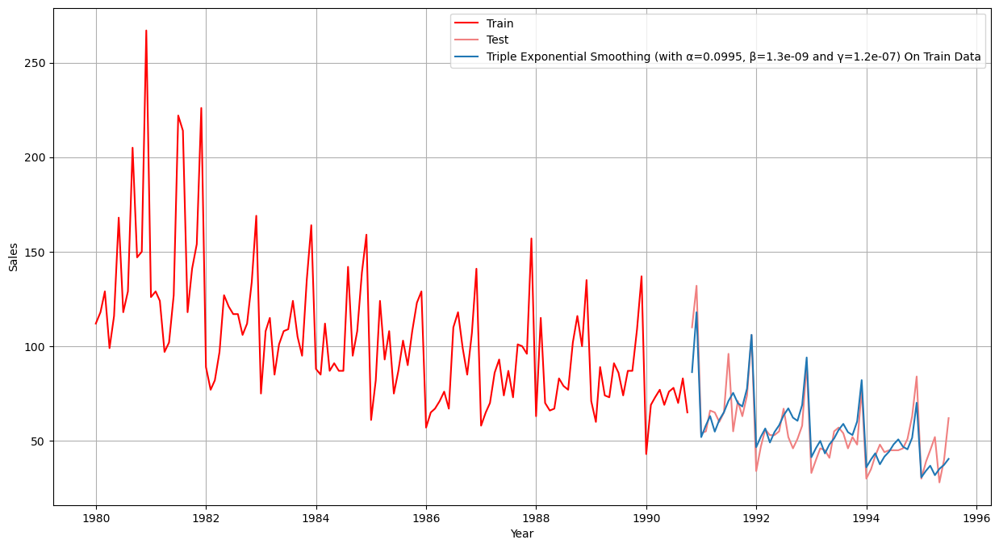

In [609]:
plt.plot( train['Rose'], label='Train',color='red')
plt.plot(test['Rose'], label='Test',color='lightcoral')
plt.plot(test['estimation6'], label='Triple Exponential Smoothing (with α=0.0995, β=1.3e-09 and γ=1.2e-07) On Train Data')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose13.jpg")




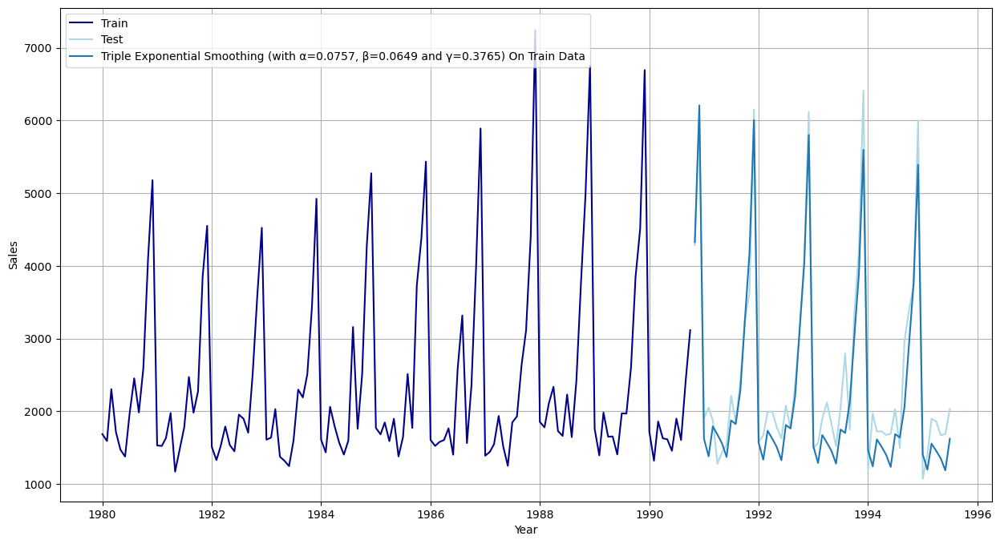

In [610]:
plt.plot( train_2['Sparkling'], label='Train',color='darkblue')
plt.plot(test_2['Sparkling'], label='Test',color='lightblue')
plt.plot(test_2['estimation6'], label='Triple Exponential Smoothing (with α=0.0757, β=0.0649 and γ=0.3765) On Train Data')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp13.jpg")

### Model Evaluation

In [612]:
rmse_TES_Model_rose = mse(test['Rose'],test['estimation6'],squared=False)
print("For Triple Exponential Smoothing with different α, β and γ On Train Data,  RMSE is %3.3f " %(rmse_TES_Model_rose))
rose_df = pd.DataFrame({'Test RMSE(Rose)': [rmse_TES_Model_rose]},index=['Triple Exponential Smoothing (with α=0.0995, β=1.3e-09 and γ=1.2e-07)'])

rmse_TES_Model_sp = mse(test_2['Sparkling'],test_2['estimation6'],squared=False)
print("For Double Exponential Smoothing On Train Data,  RMSE is %3.3f " %(rmse_TES_Model_sp))
sparkling_df = pd.DataFrame({'Test RMSE(Sparkling)': [rmse_TES_Model_sp]},index=['Triple Exponential Smoothing (with α=0.0757, β=0.0649 and γ=0.3765)'])

results7 = pd.concat([rose_df,sparkling_df],axis=1)
results7

For Triple Exponential Smoothing with different α, β and γ On Train Data,  RMSE is 9.334 
For Double Exponential Smoothing On Train Data,  RMSE is 381.655 


,Test RMSE(Rose),Test RMSE(Sparkling)
"Triple Exponential Smoothing (with α=0.0995, β=1.3e-09 and γ=1.2e-07)",9.334081,NaN
"Triple Exponential Smoothing (with α=0.0757, β=0.0649 and γ=0.3765)",NaN,381.655272


## Comparison of different models

In [614]:
pd.concat([results1,results2,results3,results4,results5,results6,results7],axis=0)

,Test RMSE(Rose),Test RMSE(Sparkling)
Linear_Regression,17.356924,1392.438305
Simple_Average,52.431977,1368.746717
Moving_Average,11.801167,811.178937
Simple Exponential Smoothing,30.207858,1363.702251
Double Exponential Smoothing,17.356857,1472.253632
"Triple Exponential Smoothing (with α=0.0889, β=4.66e-06 and γ=0)",13.976942,NaN
"Triple Exponential Smoothing (with α=0.07569, β=0.0324 and γ=0.479)",NaN,366.859156
"Triple Exponential Smoothing (with α=0.0995, β=1.3e-09 and γ=1.2e-07)",9.334081,NaN
"Triple Exponential Smoothing (with α=0.0757, β=0.0649 and γ=0.3765)",NaN,381.655272


# Check for Stationarity

- A Time Series is considered to be stationary **when statistical properties such as the variance and (auto) correlation are constant over time.**


- Stationary Time Series allows us to think of the statistical properties of the time series as not changing in time, which enables us to build appropriate statistical models for forecasting based on past data. 


- Stationarity means that the **autocorrelation of lag ‘k’ depends on k, but not on time t.** 

    - <font color='blue'> Let $𝑋_𝑡$  denote the time series at time t.

    - Autocorrelation of lag k is the correlation between $𝑋_{𝑡}$  and $𝑋_{(𝑡−𝑘)}$</font> 




## How to check for Stationarity?


**---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

**<font color='blue'>Dickey-Fuller Test</font>** - Dicky Fuller Test on the timeseries is run to check for stationarity of data. 

- **Null Hypothesis $H_{0}$**: Time Series is non-stationary.
- **Alternate Hypothesis $𝑯_{𝒂}$**: Time Series is stationary.

*So Ideally if p-value < 0.05 then null hypothesis: TS is non-stationary is rejected else the TS is non-stationary is failed to be rejected .*



**---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**


### Check for stationarity of the series at $\alpha$ = 0.05 using appropriate statistical tests.

In [619]:
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt
import pandas as pd

def test_stationarity(timeseries, save_path=None):
    """
    Test for stationarity of a time series using rolling statistics and Dickey-Fuller test
    
    Parameters:
    timeseries (pd.Series): Time series data to analyze
    save_path (str): Optional path to save the plot. If None, plot won't be saved
    """
    # Determining rolling statistics
    rolmean = timeseries.rolling(window=7).mean()  # rolling mean
    rolstd = timeseries.rolling(window=7).std()    # rolling standard deviation

    # Plot rolling statistics
    plt.figure(figsize=(12, 6))
    orig = plt.plot(timeseries, color='blue', label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    
    # Save the plot if save_path is provided
    if save_path:
        plt.savefig(save_path)
        print(f"Plot saved to: {save_path}")
    
    plt.show(block=False)
    
    # Perform Dickey-Fuller test
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], 
                        index=['Test Statistic', 'p-value', 
                               '#Lags Used', 'Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput[f'Critical Value ({key})'] = value
    print(dfoutput, '\n')

Plot saved to: D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose-stationary.jpg


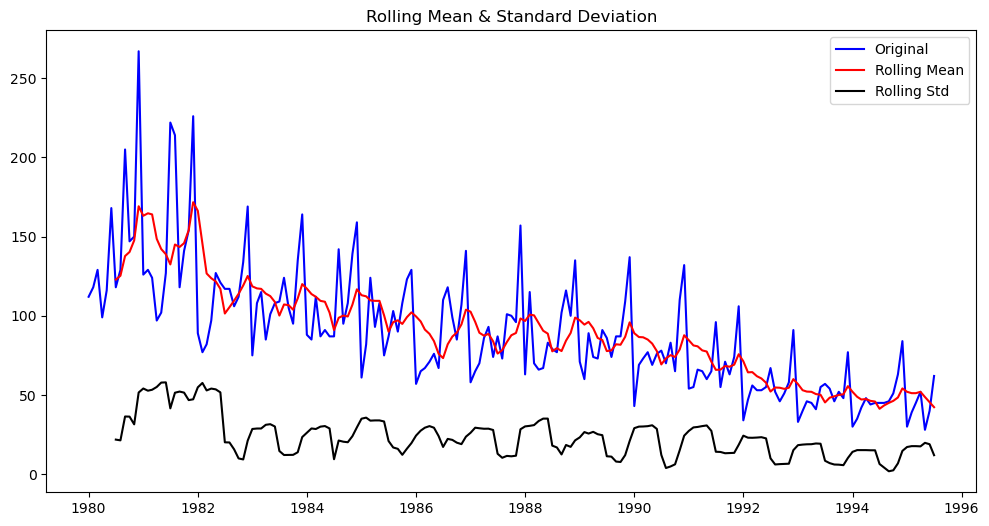

Results of Dickey-Fuller Test:
Test Statistic                  -1.874856
p-value                          0.343981
#Lags Used                      13.000000
Number of Observations Used    173.000000
Critical Value (1%)             -3.468726
Critical Value (5%)             -2.878396
Critical Value (10%)            -2.575756
dtype: float64 



In [620]:
test_stationarity(df1['Rose'],save_path=r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose-stationary.jpg")


As p value for both are greater than 0.05 than it is clear that both timeseries are non-stationary.

Plot saved to: D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp-stationary.jpg


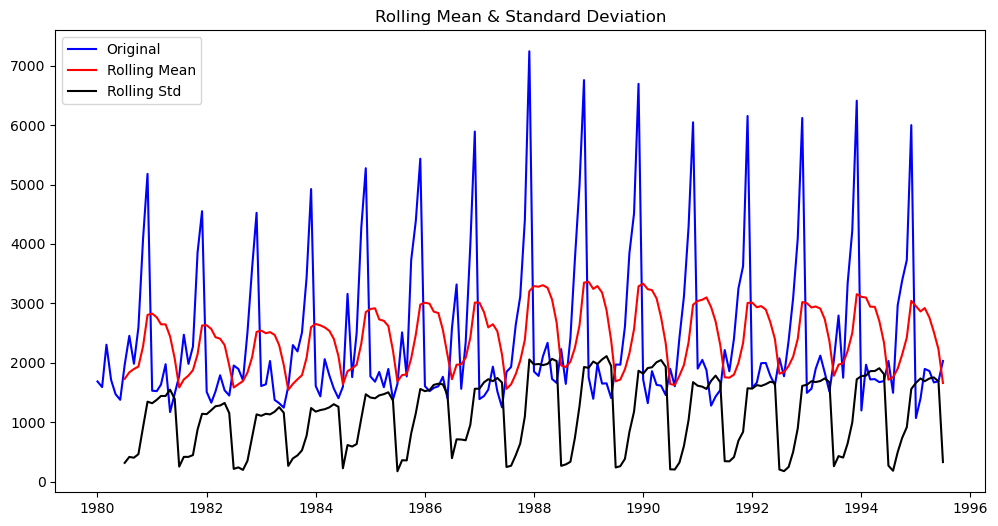

Results of Dickey-Fuller Test:
Test Statistic                  -1.360497
p-value                          0.601061
#Lags Used                      11.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [622]:
test_stationarity(df2['Sparkling'],save_path=r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp-stationary.jpg")

Plot saved to: D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose-stationary-2.jpg


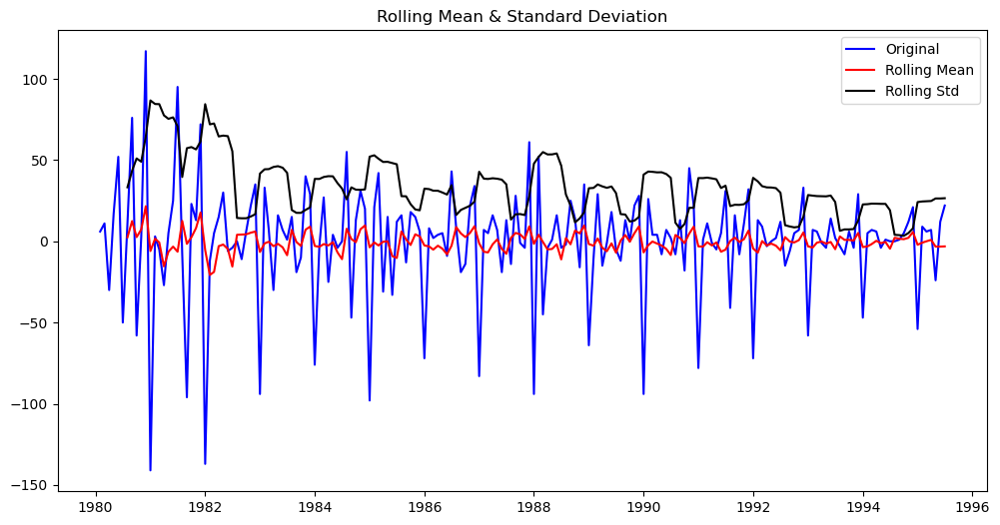

Results of Dickey-Fuller Test:
Test Statistic                -8.044139e+00
p-value                        1.813580e-12
#Lags Used                     1.200000e+01
Number of Observations Used    1.730000e+02
Critical Value (1%)           -3.468726e+00
Critical Value (5%)           -2.878396e+00
Critical Value (10%)          -2.575756e+00
dtype: float64 



In [623]:
test_stationarity(df1['Rose'].diff().dropna(),save_path=r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose-stationary-2.jpg")

Plot saved to: D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp-stationary-2.jpg


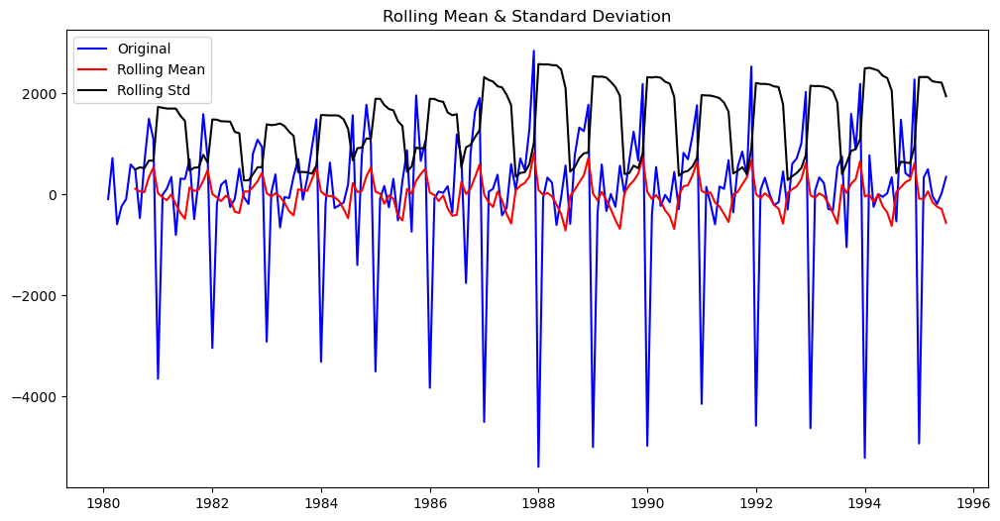

Results of Dickey-Fuller Test:
Test Statistic                 -45.050301
p-value                          0.000000
#Lags Used                      10.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [624]:
test_stationarity(df2['Sparkling'].diff().dropna(),save_path=r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp-stationary-2.jpg")

If the series is non-stationary, stationarize the Time Series by taking a difference of the Time Series. Then we can use this particular differenced series to train the ARIMA models. We do not need to worry about stationarity for the Test Data because we are not building any models on the Test Data, we are evaluating our models over there. You can look at other kinds of transformations as part of making the time series stationary like taking logarithms.

# Model building

##  ARIMA Model

## Plot the Autocorrelation function plots on the whole data.

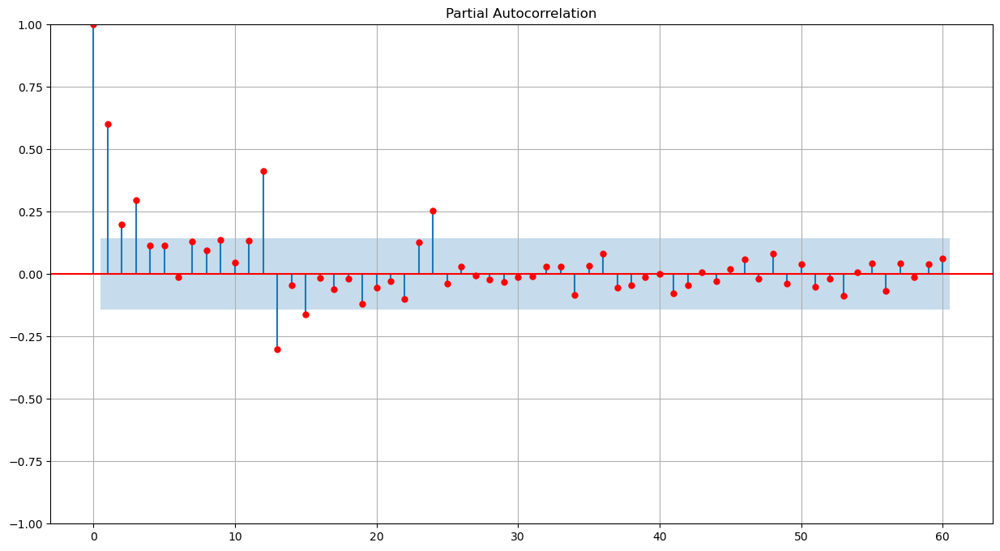

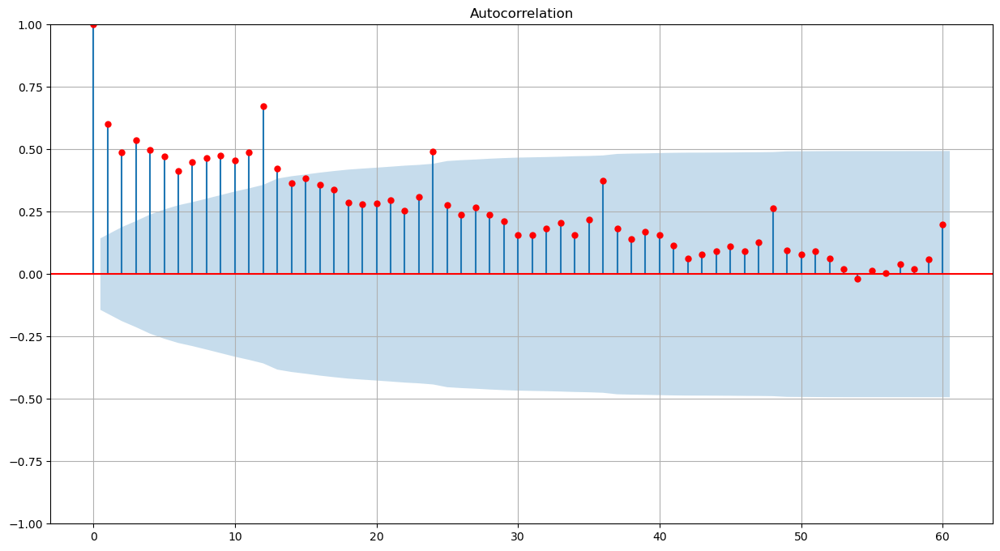

In [629]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_pacf(df1['Rose'],lags=60,color='red')
plt.grid()
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose20.jpg")
plot_acf(df1['Rose'],lags=60,color='red')
plt.grid()
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose21.jpg")

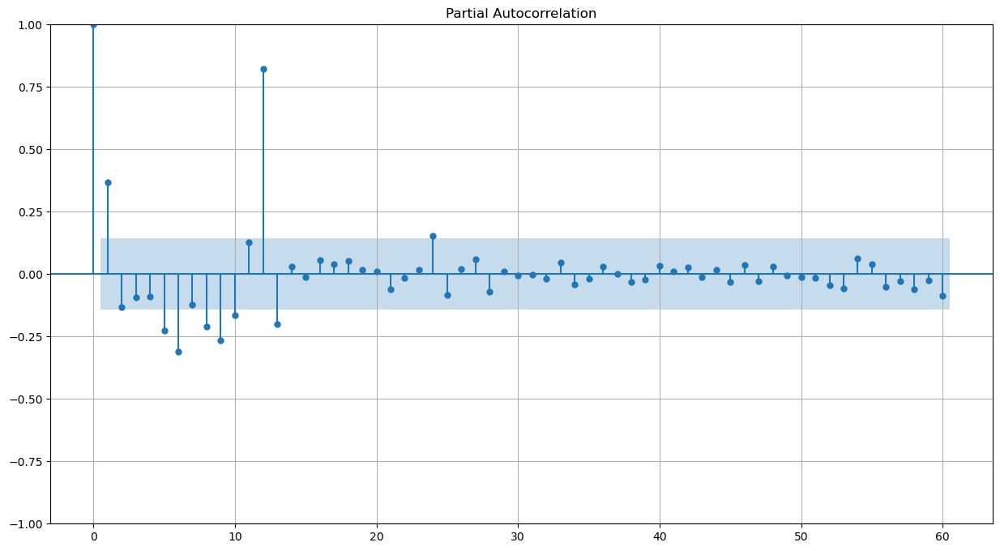

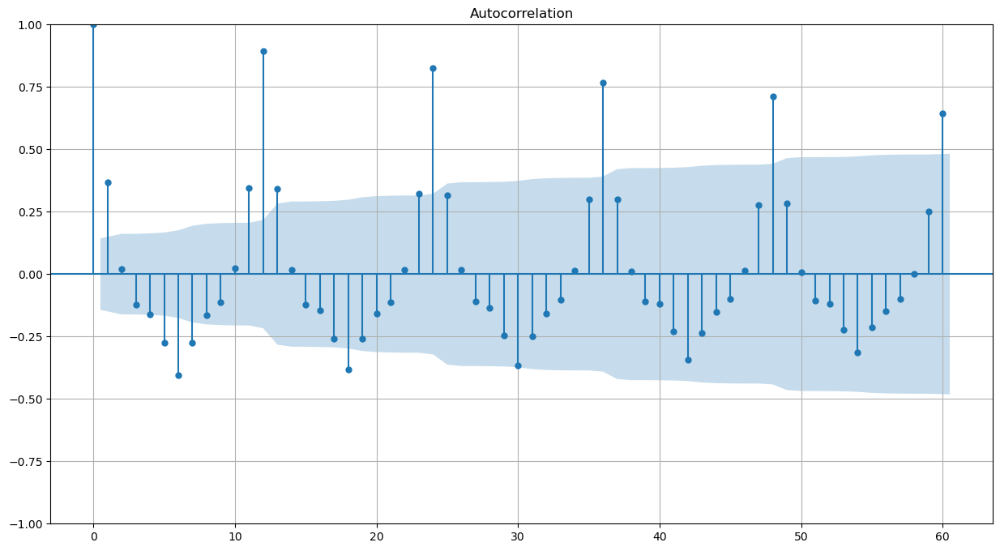

In [630]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_pacf(df2['Sparkling'],lags=60)
plt.grid()
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp20.jpg")
plot_acf(df2['Sparkling'],lags=60)
plt.grid()
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp21.jpg")

##### Note: The data has some seasonality so ideally we should build a SARIMA model. But for demonstration purposes we are building an ARIMA model both by looking at the minimum AIC criterion and by looking at the ACF and the PACF plots.

In [632]:
import itertools
p=q=range(0,3)
d=range(0,2)
pdq = list(itertools.product(p, d, q))
print('Some parameter combinations for the Model...')
for i in range(1,len(pdq)):
    print(f'Model: {pdq[i]}')

Some parameter combinations for the Model...
Model: (0, 0, 1)
Model: (0, 0, 2)
Model: (0, 1, 0)
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (1, 0, 0)
Model: (1, 0, 1)
Model: (1, 0, 2)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (2, 0, 0)
Model: (2, 0, 1)
Model: (2, 0, 2)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)


In [633]:
from statsmodels.tsa.arima.model import ARIMA
models =[]
print('For Rose')
for param in pdq:
    ARIMA_model = ARIMA(train['Rose'],order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_model.aic))
    models.append((param,ARIMA_model.aic))
arima_aic=pd.DataFrame(models,columns=['Model' ,'AIC'])

print('For Sparkling')
models =[]
for param in pdq:
    ARIMA_model = ARIMA(train_2['Sparkling'],order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_model.aic))
    models.append((param,ARIMA_model.aic))
arima_aic_sp=pd.DataFrame(models,columns=['Model' ,'AIC'])



For Rose
ARIMA(0, 0, 0) - AIC:1306.2886900845197
ARIMA(0, 0, 1) - AIC:1287.0930680691954
ARIMA(0, 0, 2) - AIC:1288.116815603096
ARIMA(0, 1, 0) - AIC:1313.1758613526429
ARIMA(0, 1, 1) - AIC:1261.3274438405808
ARIMA(0, 1, 2) - AIC:1259.2477803151237
ARIMA(1, 0, 0) - AIC:1282.884243262672
ARIMA(1, 0, 1) - AIC:1273.9696715616656
ARIMA(1, 0, 2) - AIC:1272.008960561904
ARIMA(1, 1, 0) - AIC:1297.0772943848615
ARIMA(1, 1, 1) - AIC:1260.0367627036055
ARIMA(1, 1, 2) - AIC:1259.4732049501204
ARIMA(2, 0, 0) - AIC:1283.4621278745708
ARIMA(2, 0, 1) - AIC:1272.7845600980152
ARIMA(2, 0, 2) - AIC:1272.2305289579135
ARIMA(2, 1, 0) - AIC:1278.1352807484318
ARIMA(2, 1, 1) - AIC:1261.0140762916922
ARIMA(2, 1, 2) - AIC:1261.472000656906
For Sparkling
ARIMA(0, 0, 0) - AIC:2228.4836604091106
ARIMA(0, 0, 1) - AIC:2204.8697988529457
ARIMA(0, 0, 2) - AIC:2206.111207435096
ARIMA(0, 1, 0) - AIC:2232.719438106631
ARIMA(0, 1, 1) - AIC:2217.9392215777407
ARIMA(0, 1, 2) - AIC:2194.0343613616024
ARIMA(1, 0, 0) - AIC:22

In [816]:
arima_aic.sort_values(by='AIC',ascending=True)


,Model,AIC
5,"(0, 1, 2)",1259.247780
11,"(1, 1, 2)",1259.473205
10,"(1, 1, 1)",1260.036763
16,"(2, 1, 1)",1261.014076
4,"(0, 1, 1)",1261.327444
17,"(2, 1, 2)",1261.472001
8,"(1, 0, 2)",1272.008961
14,"(2, 0, 2)",1272.230529
13,"(2, 0, 1)",1272.784560
7,"(1, 0, 1)",1273.969672


In [635]:
arima_aic_sp.sort_values(by='AIC',ascending=True)

,Model,AIC
17,"(2, 1, 2)",2178.109723
16,"(2, 1, 1)",2193.974962
5,"(0, 1, 2)",2194.034361
11,"(1, 1, 2)",2194.959653
10,"(1, 1, 1)",2196.050086
13,"(2, 0, 1)",2197.084442
1,"(0, 0, 1)",2204.869799
12,"(2, 0, 0)",2204.880722
2,"(0, 0, 2)",2206.111207
7,"(1, 0, 1)",2206.142158


In [636]:
manual_arima_1 = ARIMA(train['Rose'],order=(0,1,2)).fit()
print(manual_arima_1.summary())

                               SARIMAX Results                                
Dep. Variable:                   Rose   No. Observations:                  130
Model:                 ARIMA(0, 1, 2)   Log Likelihood                -626.624
Date:                Sun, 06 Apr 2025   AIC                           1259.248
Time:                        18:58:38   BIC                           1267.827
Sample:                    01-01-1980   HQIC                          1262.734
                         - 10-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7059      0.072     -9.851      0.000      -0.846      -0.565
ma.L2         -0.1915      0.074     -2.574      0.010      -0.337      -0.046
sigma2       958.5998     86.875     11.034      0.0

In [637]:
manual_arima_2 = ARIMA(train['Rose'],order=(1,1,2)).fit()
print(manual_arima_2.summary())

                               SARIMAX Results                                
Dep. Variable:                   Rose   No. Observations:                  130
Model:                 ARIMA(1, 1, 2)   Log Likelihood                -625.737
Date:                Sun, 06 Apr 2025   AIC                           1259.473
Time:                        18:58:39   BIC                           1270.912
Sample:                    01-01-1980   HQIC                          1264.121
                         - 10-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4649      0.274     -1.698      0.090      -1.002       0.072
ma.L1         -0.2485      0.253     -0.983      0.326      -0.744       0.247
ma.L2         -0.5971      0.208     -2.874      0.0

In [638]:
manual_arima_sp1 = ARIMA(train_2['Sparkling'],order=(2,1,2)).fit()
print(manual_arima_sp1.summary())
manual_arima_sp2 = ARIMA(train_2['Sparkling'],order=(2,1,1)).fit()
print(manual_arima_sp2.summary())

                               SARIMAX Results                                
Dep. Variable:              Sparkling   No. Observations:                  130
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -1084.055
Date:                Sun, 06 Apr 2025   AIC                           2178.110
Time:                        18:58:41   BIC                           2192.409
Sample:                    01-01-1980   HQIC                          2183.920
                         - 10-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3020      0.046     28.542      0.000       1.213       1.391
ar.L2         -0.5360      0.079     -6.763      0.000      -0.691      -0.381
ma.L1         -1.9916      0.109    -18.211      0.0

## Predict on the Test Set using this model and evaluate the model.

In [640]:
test['estimation7'] = manual_arima_1.forecast(steps=len(test))
test['estimation8'] = manual_arima_2.forecast(steps=len(test))

test_2['estimation7'] = manual_arima_sp1.forecast(steps=len(test))



test_2['estimation8'] = manual_arima_sp2.forecast(steps=len(test))


### Model Building

In [642]:
rmse_arima_Model_rose = mse(test['Rose'],test['estimation7'],squared=False)
print("For ARIMA model with p=0,d=1 and q=2 On Train Data,  RMSE is %3.3f " %(rmse_arima_Model_rose))
rose_df = pd.DataFrame({'Test RMSE(Rose)': [rmse_arima_Model_rose]},index=['ARIMA model with p=0,d=1 and q=2'])

rmse_arima_Model_rose = mse(test['Rose'],test['estimation8'],squared=False)
print("For ARIMA model with p=1,d=1 and q=2 On Train Data,  RMSE is %3.3f " %(rmse_arima_Model_rose))
rose_df_2 = pd.DataFrame({'Test RMSE(Rose)': [rmse_arima_Model_rose]},index=['ARIMA model with p=1,d=1 and q=2'])

rmse_arima_Model_sp = mse(test_2['Sparkling'],test_2['estimation7'],squared=False)
print("For ARIMA model with p=2,d=1 and q=2 On Train Data,  RMSE is %3.3f " %(rmse_arima_Model_sp))
sparkling_df = pd.DataFrame({'Test RMSE(Sparkling)': [rmse_arima_Model_sp]},index=['ARIMA model with p=2,d=1 and q=2'])

rmse_arima_Model_sp = mse(test_2['Sparkling'],test_2['estimation8'],squared=False)
print("For ARIMA model with p=2,d=1 and q=1 On Train Data,  RMSE is %3.3f " %(rmse_arima_Model_sp))
sparkling_df_2 = pd.DataFrame({'Test RMSE(Sparkling)': [rmse_arima_Model_sp]},index=['ARIMA model with p=2,d=1 and q=1'])

results8 = pd.concat([rose_df,sparkling_df,rose_df_2,sparkling_df_2],axis=1)
results8

For ARIMA model with p=0,d=1 and q=2 On Train Data,  RMSE is 30.923 
For ARIMA model with p=1,d=1 and q=2 On Train Data,  RMSE is 30.488 
For ARIMA model with p=2,d=1 and q=2 On Train Data,  RMSE is 1325.166 
For ARIMA model with p=2,d=1 and q=1 On Train Data,  RMSE is 1359.650 


,Test RMSE(Rose),Test RMSE(Sparkling),Test RMSE(Rose),Test RMSE(Sparkling)
"ARIMA model with p=0,d=1 and q=2",30.923376,NaN,NaN,NaN
"ARIMA model with p=2,d=1 and q=2",NaN,1325.16625,NaN,NaN
"ARIMA model with p=1,d=1 and q=2",NaN,NaN,30.487641,NaN
"ARIMA model with p=2,d=1 and q=1",NaN,NaN,NaN,1359.649838


In [643]:
results8 = pd.concat([sparkling_df,rose_df_2],axis=1)
results8

,Test RMSE(Sparkling),Test RMSE(Rose)
"ARIMA model with p=2,d=1 and q=2",1325.16625,NaN
"ARIMA model with p=1,d=1 and q=2",NaN,30.487641


#Plotting the best ARIMA model out of these

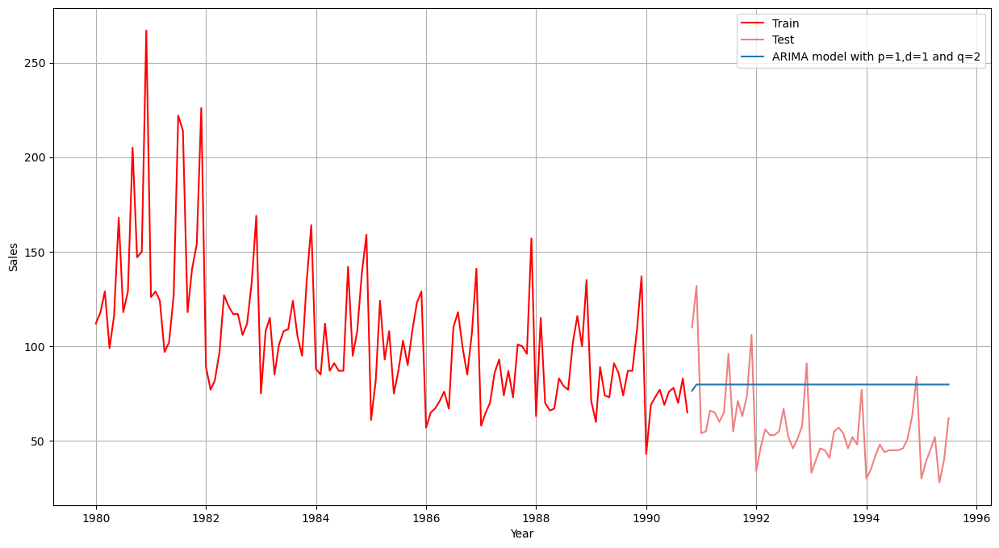

In [645]:
plt.plot( train['Rose'], label='Train',color='red')
plt.plot(test['Rose'], label='Test',color='lightcoral')
plt.plot(test['estimation7'], label='ARIMA model with p=1,d=1 and q=2')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose22.jpg")




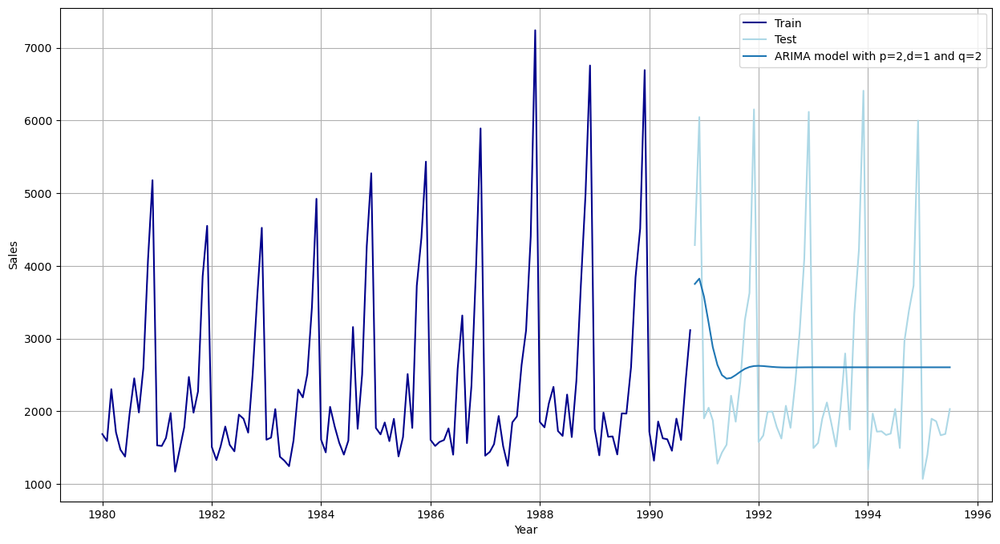

In [646]:
plt.plot( train_2['Sparkling'], label='Train',color='darkblue')
plt.plot(test_2['Sparkling'], label='Test',color='lightblue')
plt.plot(test_2['estimation7'], label='ARIMA model with p=2,d=1 and q=2')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp22.jpg")

###  Auto ARIMA

In [648]:
from pmdarima import auto_arima

model = auto_arima(
    train['Rose'],
    seasonal=False,  # Disable seasonal ARIMA
    stepwise=True,   # Faster search
    trace=True       # Print progress
)
print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.75 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1315.165, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1299.056, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1313.176, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1280.082, Time=0.73 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=1278.774, Time=0.81 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=1277.586, Time=0.92 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=1279.302, Time=1.36 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=2.53 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=1275.676, Time=0.81 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=1276.843, Time=0.58 sec
 ARIMA(5,1,0)(0,0,0)[0]             : AIC=1277.406, Time=0

In [649]:
from pmdarima import auto_arima

model = auto_arima(
    train_2['Sparkling'],
    seasonal=False,  # Disable seasonal ARIMAARIMA model with p=0,d=1 and q=2
    stepwise=True,   # Faster search
    trace=True       # Print progress
)
print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=2.22 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2422.783, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2244.390, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2331.596, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2244.916, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2242.972, Time=0.31 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=1.57 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=inf, Time=1.12 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=2291.309, Time=0.95 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2206.535, Time=0.39 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2205.446, Time=0.45 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2228.475, Time=0.15 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2206.008, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2207.502, Time=0.26 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2207.4

In [820]:
manual_arima_sp2 = ARIMA(train_2['Sparkling'],order=(0,0,1)).fit()
print(manual_arima_sp2.summary)
test_2['estimation11'] = manual_arima_sp2.forecast(steps=len(test))
rmse_arima_Model_sp = mse(test_2['Sparkling'],test_2['estimation11'],squared=False)
print("For ARIMA model with p=2,d=1 and q=1 On Train Data,  RMSE is %3.3f " %(rmse_arima_Model_sp))
sparkling_df_2 = pd.DataFrame({'Test RMSE(Sparkling)': [rmse_arima_Model_sp]},index=['ARIMA model with p=0,d=0 and q=1'])
sparkling_df_2

<bound method SARIMAXResults.summary of <statsmodels.tsa.arima.model.ARIMAResults object at 0x000001D534B1F590>>
For ARIMA model with p=2,d=1 and q=1 On Train Data,  RMSE is 1362.761 


,Test RMSE(Sparkling)
"ARIMA model with p=0,d=0 and q=1",1362.760895


##  SRIMA Model

## Plot the Autocorrelation function plots on the whole data.

In [652]:
import itertools
p = q = range(0, 3)
d= range(1,2)
D = range(0,2)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of some parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))

Examples of some parameter combinations for Model...
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (1, 1, 0)(0, 1, 0, 12)
Model: (1, 1, 1)(0, 1, 1, 12)
Model: (1, 1, 2)(0, 1, 2, 12)
Model: (2, 1, 0)(1, 0, 0, 12)
Model: (2, 1, 1)(1, 0, 1, 12)
Model: (2, 1, 2)(1, 0, 2, 12)


In [653]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
models =[]
print('For Rose')
for param in pdq:
    for param_sea in model_pdq:
        SARIMA_model = SARIMAX(train['Rose'],order=param,seasonal_order=param_sea,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False).fit(maxiter=1000)
        print(f'SARIMA{param}x{param_sea} - AIC:{SARIMA_model.aic:.2f}')
        models.append((param,param_sea,SARIMA_model.aic))
sarima_aic=pd.DataFrame(models,columns=['parameters' ,'Seasonal parameters','AIC'])

print('For Sparkling')
models =[]
for param in pdq:
    for param_sea in model_pdq:
        SARIMA_model = SARIMAX(train_2['Sparkling'],order=param,seasonal_order=param_sea,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False).fit(maxiter=1000)
        print(f'SARIMA{param}x{param_sea} - AIC:{SARIMA_model.aic:.2f}')
        models.append((param,param_sea,SARIMA_model.aic))
sarima_aic_sp=pd.DataFrame(models,columns=['parameters' ,'Seasonal parameters','AIC'])



For Rose
SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:1303.98
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:1127.03
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:956.41
SARIMA(0, 1, 0)x(0, 1, 0, 12) - AIC:1152.89
SARIMA(0, 1, 0)x(0, 1, 1, 12) - AIC:946.53
SARIMA(0, 1, 0)x(0, 1, 2, 12) - AIC:827.42
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:1121.40
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:1097.17
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:950.70
SARIMA(0, 1, 0)x(1, 1, 0, 12) - AIC:963.31
SARIMA(0, 1, 0)x(1, 1, 1, 12) - AIC:955.90
SARIMA(0, 1, 0)x(1, 1, 2, 12) - AIC:829.22
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:941.29
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:943.26
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:936.31
SARIMA(0, 1, 0)x(2, 1, 0, 12) - AIC:839.13
SARIMA(0, 1, 0)x(2, 1, 1, 12) - AIC:834.49
SARIMA(0, 1, 0)x(2, 1, 2, 12) - AIC:824.38
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:1242.58
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:1079.98
SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:904.31
SARIMA(0, 1, 1)x(0, 1, 0, 12) - AIC:1096.76
SARIMA(0, 1, 1)x(0, 1, 1, 12) - AIC:8

In [654]:
sarima_aic.sort_values(by='AIC',ascending=True)


,parameters,Seasonal parameters,AIC
53,"(0, 1, 2)","(2, 1, 2, 12)",759.854456
107,"(1, 1, 2)","(2, 1, 2, 12)",761.834085
161,"(2, 1, 2)","(2, 1, 2, 12)",763.820849
35,"(0, 1, 1)","(2, 1, 2, 12)",767.375258
41,"(0, 1, 2)","(0, 1, 2, 12)",768.421506
...,...,...,...
18,"(0, 1, 1)","(0, 0, 0, 12)",1242.576606
126,"(2, 1, 1)","(0, 0, 0, 12)",1242.720024
108,"(2, 1, 0)","(0, 0, 0, 12)",1259.783325
54,"(1, 1, 0)","(0, 0, 0, 12)",1287.886350


In [655]:
sarima_aic_sp.sort_values(by='AIC',ascending=True)


,parameters,Seasonal parameters,AIC
95,"(1, 1, 2)","(0, 1, 2, 12)",1351.700368
41,"(0, 1, 2)","(0, 1, 2, 12)",1352.195894
101,"(1, 1, 2)","(1, 1, 2, 12)",1353.484193
149,"(2, 1, 2)","(0, 1, 2, 12)",1353.646137
107,"(1, 1, 2)","(2, 1, 2, 12)",1353.678153
...,...,...,...
72,"(1, 1, 1)","(0, 0, 0, 12)",2165.914890
108,"(2, 1, 0)","(0, 0, 0, 12)",2190.833869
18,"(0, 1, 1)","(0, 0, 0, 12)",2193.281680
54,"(1, 1, 0)","(0, 0, 0, 12)",2214.851626


In [656]:
manual_sarima_1 = SARIMAX(train['Rose'],order=(0,1,2),seasonal_order=(2, 1, 2, 12),enforce_stationarity=False,enforce_invertibility=False).fit(maxiter=1000)
print(manual_sarima_1.summary())

                                     SARIMAX Results                                      
Dep. Variable:                               Rose   No. Observations:                  130
Model:             SARIMAX(0, 1, 2)x(2, 1, 2, 12)   Log Likelihood                -372.927
Date:                            Sun, 06 Apr 2025   AIC                            759.854
Time:                                    19:26:30   BIC                            777.353
Sample:                                01-01-1980   HQIC                           766.911
                                     - 10-01-1990                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9328      0.191     -4.879      0.000      -1.308      -0.558
ma.L2         -0.0923      0.126   

In [657]:
manual_sarima_sp = SARIMAX(train_2['Sparkling'],order=(1,1,2),seasonal_order=(0,1,2,12),enforce_stationarity=False,enforce_invertibility=False).fit(maxiter=1000)
print(manual_sarima_sp.summary())

                                     SARIMAX Results                                      
Dep. Variable:                          Sparkling   No. Observations:                  130
Model:             SARIMAX(1, 1, 2)x(0, 1, 2, 12)   Log Likelihood                -669.850
Date:                            Sun, 06 Apr 2025   AIC                           1351.700
Time:                                    19:26:37   BIC                           1366.699
Sample:                                01-01-1980   HQIC                          1357.749
                                     - 10-01-1990                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5355      0.225     -2.380      0.017      -0.977      -0.094
ma.L1         -0.2232      0.259   

## Predict on the Test Set using this model and evaluate the model.

In [659]:
test['estimation9'] = manual_sarima_1.forecast(steps=len(test))

test_2['estimation9'] = manual_sarima_sp.forecast(steps=len(test))

### Model Building

In [661]:
rmse_arima_Model_rose = mse(test['Rose'],test['estimation9'],squared=False)
print("For SARIMA model((0,1,2)(2, 1, 2, 12)) On Train Data,  RMSE is %3.3f " %(rmse_arima_Model_rose))
rose_df = pd.DataFrame({'Test RMSE(Rose)': [rmse_arima_Model_rose]},index=['SARIMA model ((0,1,2)(2, 1, 2, 12))'])

rmse_arima_Model_sp = mse(test_2['Sparkling'],test_2['estimation9'],squared=False)
print("For SARIMA model ((1,1,2)(0, 1, 2, 12)) On Train Data,  RMSE is %3.3f " %(rmse_arima_Model_sp))
sparkling_df = pd.DataFrame({'Test RMSE(Sparkling)': [rmse_arima_Model_sp]},index=['SARIMA model ((1,1,2)(0, 1, 2, 12))'])

results9 = pd.concat([rose_df,sparkling_df],axis=1)
results9

For SARIMA model((0,1,2)(2, 1, 2, 12)) On Train Data,  RMSE is 15.426 
For SARIMA model ((1,1,2)(0, 1, 2, 12)) On Train Data,  RMSE is 440.187 


,Test RMSE(Rose),Test RMSE(Sparkling)
"SARIMA model ((0,1,2)(2, 1, 2, 12))",15.426391,NaN
"SARIMA model ((1,1,2)(0, 1, 2, 12))",NaN,440.186889


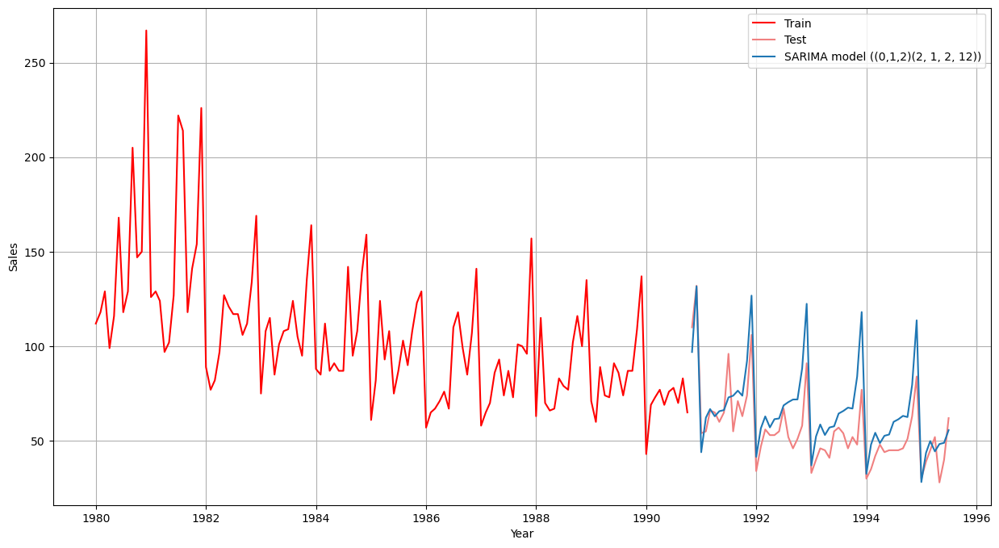

In [662]:
plt.plot( train['Rose'], label='Train',color='red')
plt.plot(test['Rose'], label='Test',color='lightcoral')
plt.plot(test['estimation9'], label='SARIMA model ((0,1,2)(2, 1, 2, 12))')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose25.jpg")




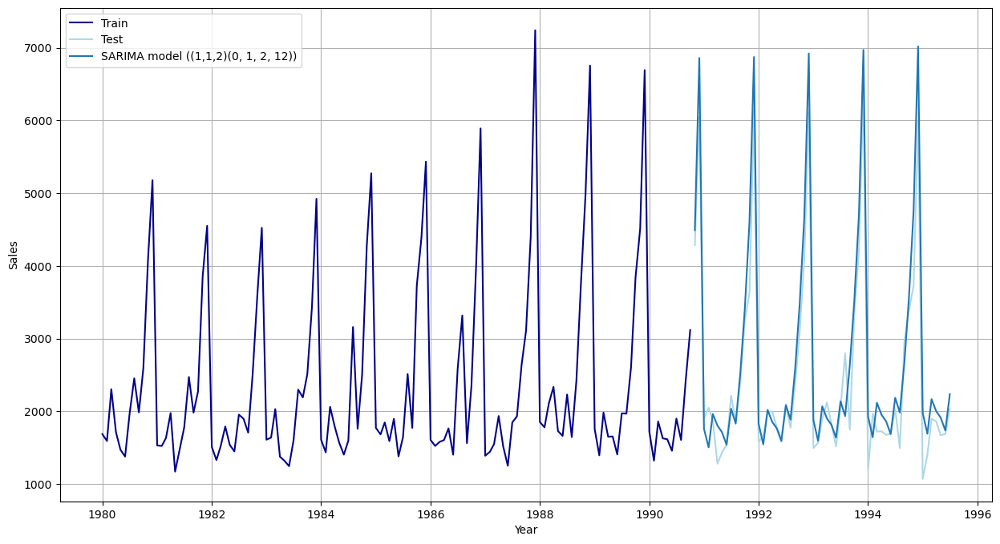

In [663]:
plt.plot( train_2['Sparkling'], label='Train',color='darkblue')
plt.plot(test_2['Sparkling'], label='Test',color='lightblue')
plt.plot(test_2['estimation9'], label='SARIMA model ((1,1,2)(0, 1, 2, 12))')

plt.legend(loc='best')
plt.grid();
# Customize the plot
plt.xlabel("Year")
plt.ylabel("Sales") 
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp25.jpg")

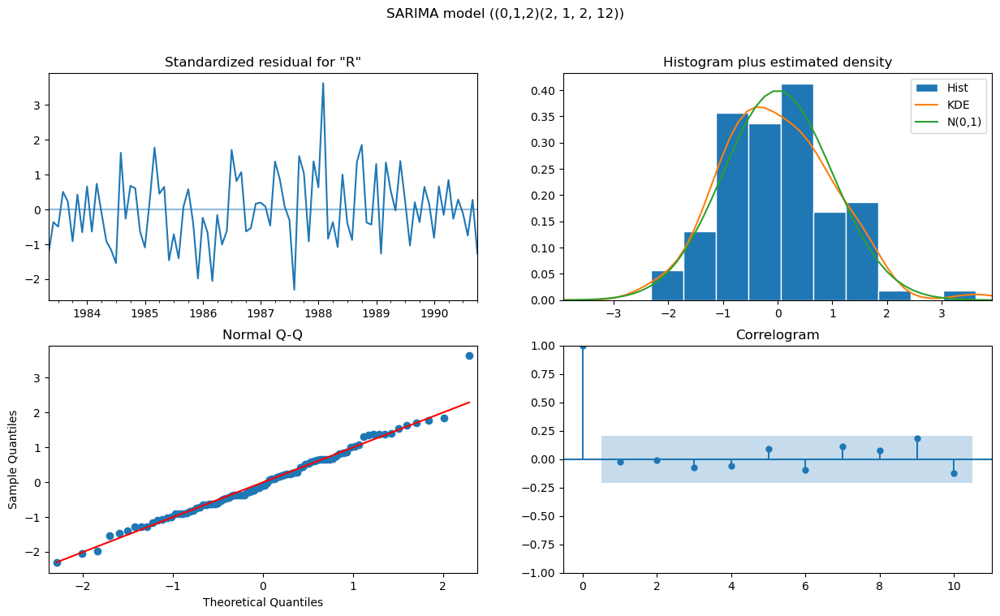

In [664]:
manual_sarima_1.plot_diagnostics()
plt.suptitle('SARIMA model ((0,1,2)(2, 1, 2, 12))')
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\rose26.jpg")


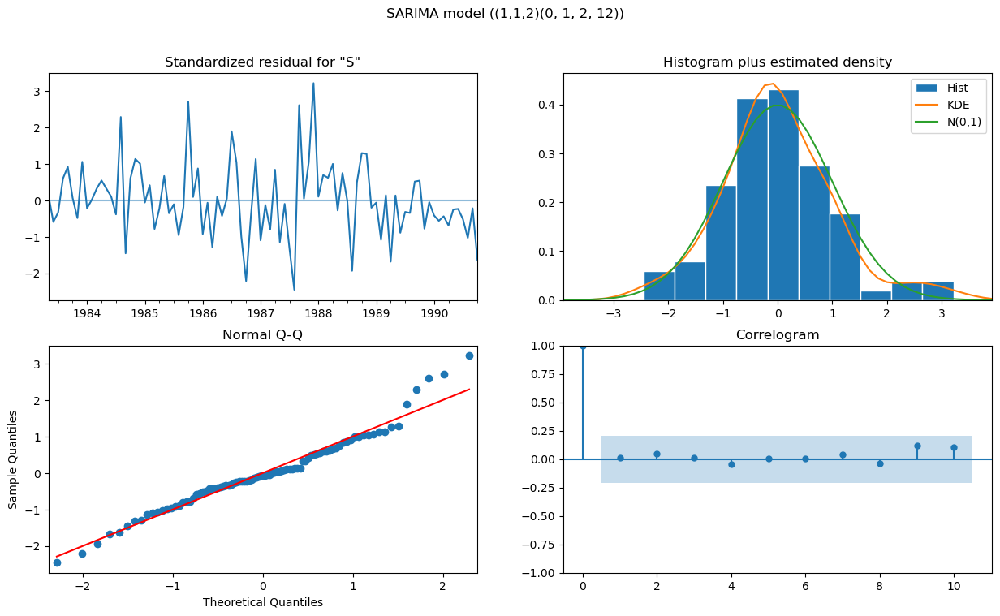

In [665]:
manual_sarima_sp.plot_diagnostics()
plt.suptitle('SARIMA model ((1,1,2)(0, 1, 2, 12))')
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\sp26.jpg")


## Auto SARIMA

In [667]:

from pmdarima import auto_arima

# Automatically find best SARIMA(p,d,q)(P,D,Q,m) parameters
model = auto_arima(
    train['Rose'],
    seasonal=True,          # Enable seasonal SARIMA
    m=12,                  # Seasonal period (e.g., 12 for monthly data)
    stepwise=True,         # Faster search
    trace=True             # Print progress
)

print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=5.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1315.165, Time=0.15 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1257.532, Time=1.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=2.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1313.176, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1299.056, Time=0.39 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1239.860, Time=2.05 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1234.971, Time=5.10 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=1236.823, Time=3.82 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=1235.072, Time=4.59 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=4.82 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=1211.221, Time=5.85 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=1209.221, Time=4.64 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : 

In [668]:
from pmdarima import auto_arima

# Automatically find best SARIMA(p,d,q)(P,D,Q,m) parameters
model = auto_arima(
    train_2['Sparkling'],
    seasonal=True,          # Enable seasonal SARIMA
    m=12,                  # Seasonal period (e.g., 12 for monthly data)
    stepwise=True,         # Faster search
    trace=True             # Print progress
)

print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=1753.900, Time=8.00 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=1772.046, Time=0.23 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=1754.854, Time=1.71 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=1747.640, Time=1.72 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=1770.140, Time=0.20 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=1767.822, Time=0.28 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=1749.538, Time=4.23 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=1749.497, Time=4.77 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=1754.421, Time=2.01 sec
 ARIMA(0,0,1)(1,1,2)[12] intercept   : AIC=1751.464, Time=10.76 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=1749.150, Time=1.98 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=1748.188, Time=4.56 sec
 ARIMA(0,0,2)(0,1,1)[12] intercept   : AIC=1749.492, Time=2.15 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=1747.889, Time=2.43 sec
 ARIMA(1,0,2)(0,1,

In [669]:
auto_sarima_1 = SARIMAX(train['Rose'],order=(5,1,1),seasonal_order=(1, 0, 1, 12),enforce_stationarity=False,enforce_invertibility=False).fit(maxiter=1000) 
print(manual_sarima_1.summary())   
auto_sarima_sp = SARIMAX(train_2['Sparkling'],order=(0,0,1),seasonal_order=(0,1,1,12),enforce_stationarity=False,enforce_invertibility=False).fit(maxiter=1000) 
print(manual_sarima_sp.summary())

                                     SARIMAX Results                                      
Dep. Variable:                               Rose   No. Observations:                  130
Model:             SARIMAX(0, 1, 2)x(2, 1, 2, 12)   Log Likelihood                -372.927
Date:                            Sun, 06 Apr 2025   AIC                            759.854
Time:                                    19:33:33   BIC                            777.353
Sample:                                01-01-1980   HQIC                           766.911
                                     - 10-01-1990                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9328      0.191     -4.879      0.000      -1.308      -0.558
ma.L2         -0.0923      0.126   

In [670]:
test['estimation10'] = auto_sarima_1.forecast(steps=len(test))

test_2['estimation10'] = auto_sarima_sp.forecast(steps=len(test))

In [671]:
rmse_arima_Model_rose = mse(test['Rose'],test['estimation10'],squared=False)
print("For SARIMA model((0,1,2)(2, 1, 2, 12)) On Train Data,  RMSE is %3.3f " %(rmse_arima_Model_rose))
rose_df = pd.DataFrame({'Test RMSE(Rose)': [rmse_arima_Model_rose]},index=['AUTO SARIMA model order=(5,1,1),seasonal_order=(1, 0, 1, 12)'])

rmse_arima_Model_sp = mse(test_2['Sparkling'],test_2['estimation10'],squared=False)
print("For SARIMA model ((1,1,2)(0, 1, 2, 12)) On Train Data,  RMSE is %3.3f " %(rmse_arima_Model_sp))
sparkling_df = pd.DataFrame({'Test RMSE(Sparkling)': [rmse_arima_Model_sp]},index=['AUTO SARIMA model order=(0,0,1),seasonal_order=(0,1,1,12)'])

results10 = pd.concat([rose_df,sparkling_df],axis=1)
results10

For SARIMA model((0,1,2)(2, 1, 2, 12)) On Train Data,  RMSE is 16.658 
For SARIMA model ((1,1,2)(0, 1, 2, 12)) On Train Data,  RMSE is 368.353 


,Test RMSE(Rose),Test RMSE(Sparkling)
"AUTO SARIMA model order=(5,1,1),seasonal_order=(1, 0, 1, 12)",16.658045,NaN
"AUTO SARIMA model order=(0,0,1),seasonal_order=(0,1,1,12)",NaN,368.352566


## Comparison of different models

In [673]:
all_models=pd.concat([results1,results2,results3,results4,results5,results6,results7,results8,results9,results10],axis=0)
print(f'Best model for Rose - {list(all_models.sort_values(by='Test RMSE(Rose)',ascending=True).index)[0]}')
print(f'Best model for Sparkling - {list(all_models.sort_values(by='Test RMSE(Sparkling)',ascending=True).index)[0]}')

Best model for Rose - Triple Exponential Smoothing (with α=0.0995, β=1.3e-09 and γ=1.2e-07)
Best model for Sparkling - Triple Exponential Smoothing (with α=0.07569, β=0.0324 and γ=0.479)


In [674]:
all_models

,Test RMSE(Rose),Test RMSE(Sparkling)
Linear_Regression,17.356924,1392.438305
Simple_Average,52.431977,1368.746717
Moving_Average,11.801167,811.178937
Simple Exponential Smoothing,30.207858,1363.702251
Double Exponential Smoothing,17.356857,1472.253632
"Triple Exponential Smoothing (with α=0.0889, β=4.66e-06 and γ=0)",13.976942,NaN
"Triple Exponential Smoothing (with α=0.07569, β=0.0324 and γ=0.479)",NaN,366.859156
"Triple Exponential Smoothing (with α=0.0995, β=1.3e-09 and γ=1.2e-07)",9.334081,NaN
"Triple Exponential Smoothing (with α=0.0757, β=0.0649 and γ=0.3765)",NaN,381.655272
"ARIMA model with p=2,d=1 and q=2",NaN,1325.166250


## Building the most optimum model on the Full Data.

In [ ]:
For Rose

In [824]:
model_TES= ExponentialSmoothing(df1['Rose'],trend='add',seasonal='mul',initialization_method='estimated')
final_model_rose = model_TES.fit(optimized=True)
final_model_rose.params

{'smoothing_level': 0.1070668233544589,
 'smoothing_trend': 5.15701403527287e-09,
 'smoothing_seasonal': 3.575195639218099e-07,
 'damping_trend': nan,
 'initial_level': 112.31080937226007,
 'initial_trend': -0.42628876297075635,
 'initial_seasons': array([0.96235607, 1.09265433, 1.20521095, 1.07741051, 1.17735654,
        1.27521315, 1.43058364, 1.47421951, 1.39208188, 1.37577335,
        1.59699595, 2.20149805]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [840]:
model_TES= ExponentialSmoothing(df2['Sparkling'],trend='add',seasonal='add',initialization_method='estimated')
model_TES_autofit_sparkling = model_TES.fit(optimized=True)
model_TES_autofit_sparkling.params

{'smoothing_level': 0.07596713146311772,
 'smoothing_trend': 0.03256921715086211,
 'smoothing_seasonal': 0.37660762886165167,
 'damping_trend': nan,
 'initial_level': 2356.500087258337,
 'initial_trend': -0.8449338106956193,
 'initial_seasons': array([-636.25474139, -723.00153617, -398.66964817, -473.45571811,
        -808.43306854, -815.37001157, -384.24814771,   73.00119661,
        -237.46281546,  272.34574748, 1541.39349329, 2590.11477306]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

## Evaluate the model on the whole and predict 12 months into the future (till the end of next year).

In [822]:
df1

,Rose
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0
...,...
1995-03-01,45.0
1995-04-01,52.0
1995-05-01,28.0


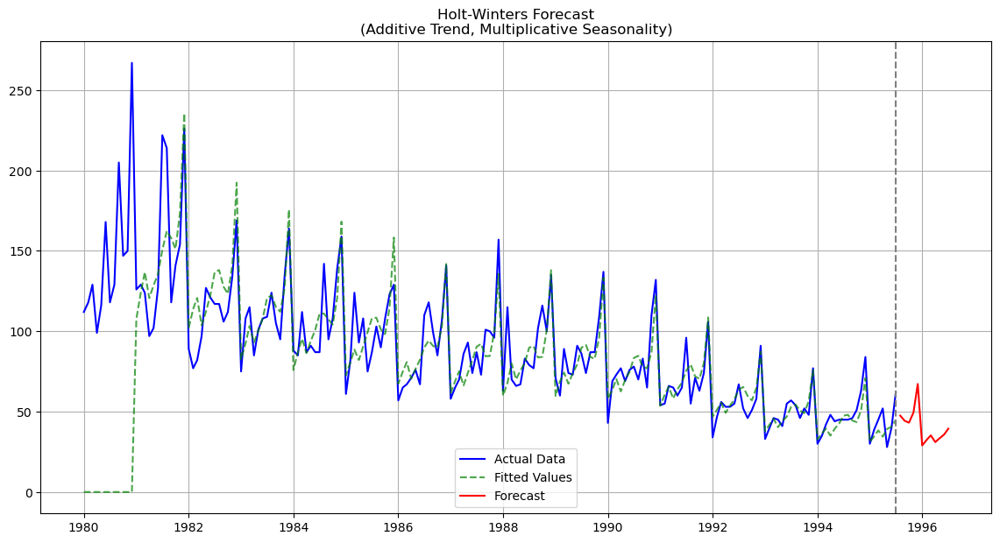

In [844]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def holt_winters_multiplicative_forecast(series, seasonal_periods, params, forecast_horizon):
    """
    Manual implementation matching:
    - Additive trend ('add')
    - Multiplicative seasonality ('mul')
    """
    n = len(series)
    level = np.zeros(n)
    trend = np.zeros(n)
    seasonal = np.zeros(n)
    fitted_values = np.zeros(n)
    forecast = np.zeros(forecast_horizon)
    
    # Extract parameters
    alpha = params['smoothing_level']
    beta = params['smoothing_trend']
    gamma = params['smoothing_seasonal']
    initial_level = params['initial_level']
    initial_trend = params['initial_trend']
    initial_seasons = params['initial_seasons']
    
    # Initialize components
    level[:seasonal_periods] = initial_level
    trend[:seasonal_periods] = initial_trend
    seasonal[:seasonal_periods] = initial_seasons
    
    # Main smoothing loop (additive trend, multiplicative seasonality)
    for t in range(seasonal_periods, n):
        level[t] = alpha * (series[t] / seasonal[t-seasonal_periods]) + (1-alpha) * (level[t-1] + trend[t-1])
        trend[t] = beta * (level[t] - level[t-1]) + (1-beta) * trend[t-1]
        seasonal[t] = gamma * (series[t] / level[t]) + (1-gamma) * seasonal[t-seasonal_periods]
        fitted_values[t] = (level[t-1] + trend[t-1]) * seasonal[t-seasonal_periods]
    
    # Forecast future values
    for t in range(forecast_horizon):
        m = t + 1
        seasonal_index = (n - seasonal_periods + t) % seasonal_periods
        forecast[t] = (level[-1] + m * trend[-1]) * seasonal[seasonal_index]
    
    return fitted_values, forecast

# Assuming df1 is already loaded with your data
df1 = df1.sort_index()

# Your parameters from the multiplicative seasonal model
params = {
    'smoothing_level': 0.1070668233544589,
    'smoothing_trend': 5.15701403527287e-09,
    'smoothing_seasonal': 3.575195639218099e-07,
    'initial_level': 112.31080937226007,
    'initial_trend': -0.42628876297075635,
    'initial_seasons': np.array([
        0.96235607, 1.09265433, 1.20521095, 1.07741051, 1.17735654,
        1.27521315, 1.43058364, 1.47421951, 1.39208188, 1.37577335,
        1.59699595, 2.20149805])
}

# Apply correct model
seasonal_periods = 12
forecast_horizon = 12
fitted_values, forecast = holt_winters_multiplicative_forecast(
    df1['Rose'].values, 
    seasonal_periods, 
    params, 
    forecast_horizon
)

# Create forecast dates
last_date = df1.index[-1]
forecast_dates = pd.date_range(start=last_date + pd.DateOffset(months=1), 
                             periods=forecast_horizon, freq='MS')

# Create pandas Series for plotting
fitted_series = pd.Series(fitted_values, index=df1.index)
forecast_series = pd.Series(forecast, index=forecast_dates)

# Plot
plt.figure(figsize=(14, 7))
plt.plot(df1.index, df1['Rose'], 'b-', label='Actual Data')
plt.plot(fitted_series.index, fitted_series, 'g--', label='Fitted Values', alpha=0.7)
plt.plot(forecast_series.index, forecast_series, 'r-', label='Forecast')
plt.axvline(last_date, color='gray', linestyle='--')
plt.title('Holt-Winters Forecast\n(Additive Trend, Multiplicative Seasonality)')
plt.legend()
plt.grid(True)

plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\roserose.jpg")

12-Month Forecast for Sparkling Wine:
            Forecast
1995-08-01   2527.42
1995-09-01   2215.71
1995-10-01   2724.27
1995-11-01   3992.07
1995-12-01   5039.55
1996-01-01   1811.93
1996-02-01   1723.94
1996-03-01   2047.02
1996-04-01   1970.99
1996-05-01   1634.76
1996-06-01   1626.58
1996-07-01   2056.45


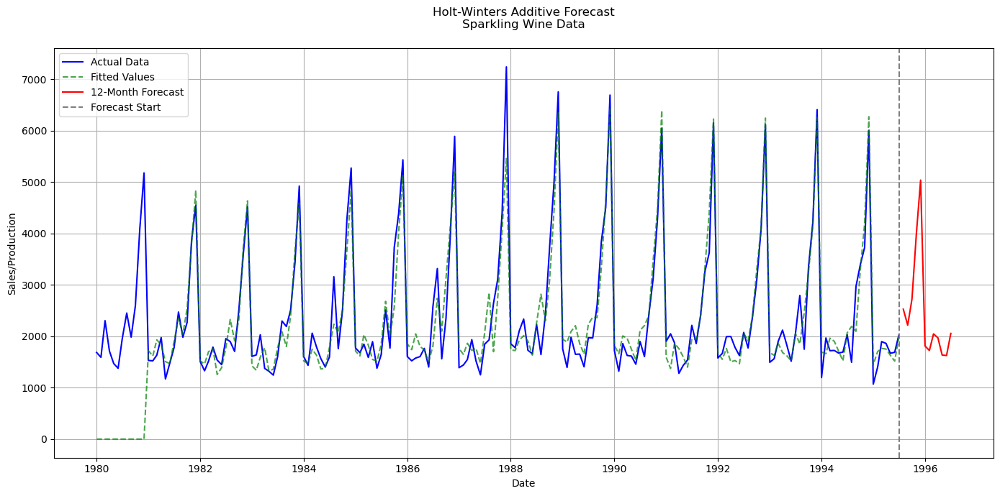

In [848]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def holt_winters_additive_forecast(series, seasonal_periods, params, forecast_horizon):
    """
    Manual implementation of Holt-Winters with:
    - Additive trend ('add')
    - Additive seasonality ('add')
    - Custom initialization parameters
    """
    n = len(series)
    level = np.zeros(n)
    trend = np.zeros(n)
    seasonal = np.zeros(n)
    fitted_values = np.zeros(n)
    forecast = np.zeros(forecast_horizon)
    
    # Extract parameters
    alpha = params['smoothing_level']
    beta = params['smoothing_trend']
    gamma = params['smoothing_seasonal']
    initial_level = params['initial_level']
    initial_trend = params['initial_trend']
    initial_seasons = params['initial_seasons']
    
    # Initialize components
    level[:seasonal_periods] = initial_level
    trend[:seasonal_periods] = initial_trend
    seasonal[:seasonal_periods] = initial_seasons
    
    # Main smoothing loop (additive trend and additive seasonality)
    for t in range(seasonal_periods, n):
        level[t] = alpha * (series[t] - seasonal[t-seasonal_periods]) + (1-alpha) * (level[t-1] + trend[t-1])
        trend[t] = beta * (level[t] - level[t-1]) + (1-beta) * trend[t-1]
        seasonal[t] = gamma * (series[t] - level[t]) + (1-gamma) * seasonal[t-seasonal_periods]
        fitted_values[t] = level[t-1] + trend[t-1] + seasonal[t-seasonal_periods]
    
    # Forecast future values
    for t in range(forecast_horizon):
        m = t + 1  # steps into the future
        seasonal_index = (n - seasonal_periods + t) % seasonal_periods
        forecast[t] = (level[-1] + m * trend[-1]) + seasonal[seasonal_index]
    
    return fitted_values, forecast

# Assuming df2 is already loaded with your Sparkling data
# Make sure it has a datetime index and 'Sparkling' column
df2 = df2.sort_index()

# Your parameters for additive model
params = {
    'smoothing_level': 0.07596713146311772,
    'smoothing_trend': 0.03256921715086211,
    'smoothing_seasonal': 0.37660762886165167,
    'initial_level': 2356.500087258337,
    'initial_trend': -0.8449338106956193,
    'initial_seasons': np.array([
        -636.25474139, -723.00153617, -398.66964817, -473.45571811,
        -808.43306854, -815.37001157, -384.24814771,   73.00119661,
        -237.46281546,  272.34574748, 1541.39349329, 2590.11477306
    ])
}

# Apply Holt-Winters with additive seasonality
seasonal_periods = 12
forecast_horizon = 12
fitted_values, forecast = holt_winters_additive_forecast(
    df2['Sparkling'].values, 
    seasonal_periods, 
    params, 
    forecast_horizon
)

# Create dates for forecast period
last_date = df2.index[-1]
forecast_dates = pd.date_range(
    start=last_date + pd.DateOffset(months=1),
    periods=forecast_horizon,
    freq='MS'  # Month Start frequency
)

# Create Series for fitted values and forecast
fitted_series = pd.Series(fitted_values, index=df2.index)
forecast_series = pd.Series(forecast, index=forecast_dates)

# Plot results
plt.figure(figsize=(14, 7))
plt.plot(df2.index, df2['Sparkling'], 'b-', label='Actual Data')
plt.plot(fitted_series.index, fitted_series, 'g--', label='Fitted Values', alpha=0.7)
plt.plot(forecast_series.index, forecast_series, 'r-', label='12-Month Forecast')
plt.axvline(last_date, color='gray', linestyle='--', label='Forecast Start')
plt.title('Holt-Winters Additive Forecast\nSparkling Wine Data', pad=20)
plt.xlabel('Date')
plt.ylabel('Sales/Production')
plt.legend()
plt.grid(True)
plt.tight_layout()
# plt.show()
plt.savefig(r"D:\Data Science\Module-8-Time-Series-Forecasting\Project\spsp.jpg")
# Print forecasted values
print("="*50)
print("12-Month Forecast for Sparkling Wine:")
print("="*50)
print(forecast_series.to_frame().rename(columns={0: 'Forecast'}).round(2))
print("="*50)